In [49]:
import sep
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt

from astropy.io import ascii
from astropy.table import Table

BANDS = ['g', 'r', 'i']
UPPER_LIMIT_MAGS = {
    'pstarr' : {'g': 23.3, 'r': 23.2, 'i': 23.1},
    'ztf': {'g': 23.3, 'r': 23.2, 'i': 23.1}
}

In [50]:
from typing import Optional

def img_ab_mag_to_flux(mag: np.ndarray, zero_point: np.ndarray, magerr: Optional[np.ndarray] = None) -> np.ndarray:
    """Inverse of img_flux_to_ab_mag."""
    flux = 10 ** ((mag - zero_point) / -2.5)
    if magerr is not None:
        fluxerr = (magerr * (np.log(10) * flux)) / 2.5
        return flux, fluxerr
    return flux

def get_snr_from_mag(mag, magerr, zp):
        flux, fluxerr = img_ab_mag_to_flux(mag, zero_point=zp, magerr=magerr)
        return flux / fluxerr

In [51]:
def _is_flag(flags: np.ndarray, flag: int) -> np.ndarray:
    return np.bitwise_and(flags.astype(int), [flag for _ in range(len(flags))]) != 0

# def mag_diff_filter(tab: Table, band: str, copy: bool = True) -> Table:
#     if copy: tab = tab.copy()
#     pstarr_mag_diff = tab[f'PSTARR_{band}PSFMag'] - tab[f'PSTARR_{band}KronMag']
#     ztf_mag_diff = tab[f'ZTF_{band}PSFMag'] - tab[f'ZTF_{band}KronMag']
#     mask = np.logical_or((pstarr_mag_diff < 0.05), (ztf_mag_diff < 0.05))
#     return tab[mask]

def catalog_filter(tab: Table, copy: bool = True, **kwargs) -> Table:
    # 0 — Both catalogs
    # 1 — ZTF, not Pan-STARRS, and not nan in either
    # 2 — Pan-STARRS, not ZTF, and not nan in either
    # 3 — Nan in either Pan-STARRS or ZTF
    if copy: tab = tab.copy()
    mask = np.isin(tab[f'Catalog_Flag'], [0, 1, 2])
    return tab[mask]

def psf_fit_filter(tab: Table, band: str, copy: bool = True) -> Table:
    # Flags here https://photutils.readthedocs.io/en/stable/api/photutils.psf.PSFPhotometry.html#photutils.psf.PSFPhotometry.__call__
    if copy: tab = tab.copy()
    mask = np.logical_or(tab[f'ZTF_{band}PSFFlags'] == 0, np.isnan(tab[f'ZTF_{band}PSFFlags']))
    mask = np.logical_or(mask, _is_flag(tab[f'ZTF_{band}PSFFlags'], 4))
    return tab[mask]

def sep_extraction_filter(tab: Table, copy: bool = True, **kwargs) -> Table:
    # flags here: https://sextractor.readthedocs.io/en/latest/Flagging.html
    if copy: tab = tab.copy()
    okay_flags = [1, 2, 3]
    mask = np.logical_or(tab[f'ZTF_sepExtractionFlag'] == 0, np.isnan(tab[f'ZTF_sepExtractionFlag']))
    for f in okay_flags:
        mask = np.logical_or(mask, _is_flag(tab[f'ZTF_sepExtractionFlag'], f))
    return tab[mask]

def snr_filter(tab: Table, band: str, snr_min: float = 5, copy: bool = True) -> Table:
    if copy: tab = tab.copy()

    # PSF
    pstarr_psf_snr = get_snr_from_mag(tab[f'PSTARR_{band}PSFMag'], tab[f'PSTARR_{band}PSFMagErr'], zp=25)
    ztf_psf_snr = get_snr_from_mag(tab[f'ZTF_{band}PSFMag'], tab[f'ZTF_{band}PSFMagErr'], zp=25)
    psf_mask = np.logical_or(
        np.logical_and((pstarr_psf_snr > snr_min), (ztf_psf_snr > snr_min)),
        np.logical_or(
            np.logical_and(np.isnan(pstarr_psf_snr), (ztf_psf_snr > snr_min)),
            np.logical_and((pstarr_psf_snr > snr_min), np.isnan(ztf_psf_snr)),
        ),
    )

    # Kron
    ztf_kron_snr = get_snr_from_mag(tab[f'ZTF_{band}KronMag'], tab[f'ZTF_{band}KronMagErr'], zp=25)
    pstarr_kron_snr = get_snr_from_mag(tab[f'PSTARR_{band}KronMag'], tab[f'PSTARR_{band}KronMagErr'], zp=25)
    kron_mask = np.logical_or(
        np.logical_and((pstarr_kron_snr > snr_min), (ztf_kron_snr > snr_min)),
        np.logical_or(
            np.logical_and(np.isnan(pstarr_kron_snr), (ztf_kron_snr > snr_min)),
            np.logical_and((pstarr_kron_snr > snr_min), np.isnan(ztf_kron_snr)),
        ),
    )

    # Total
    mask = np.logical_and(psf_mask, kron_mask)

    return tab[mask]

def shape_filter(tab: Table, copy: bool = True, **kwargs) -> Table:
    if copy: tab = tab.copy()
    good_shape_mask = (tab['ZTF_a'] / tab['ZTF_b']) < 2                                                 # a/b < 1.75
    good_shape_mask &= np.logical_or((tab['ZTF_a'] / tab['ZTF_b']) < 1.35, tab['ZTF_tnpix'] < 200)      # a/b < 1.5 for big sources
    good_shape_mask |= np.isnan(tab['ZTF_a'])

    return tab[good_shape_mask]

def preliminary_filter(original_tab: Table, band: str) -> Table:
    tab = original_tab.copy()
    for filt in [catalog_filter, psf_fit_filter, sep_extraction_filter, snr_filter, shape_filter]:
        tab = filt(tab, band=band, copy=False)
        print(f'{filt.__name__} filtered out {len(original_tab) - len(tab)} / {len(original_tab)} = {(len(original_tab) - len(tab)) / len(original_tab):.4f} sources from {band} band.')
    return tab

# Look at one field (000513)

In [32]:
# g_tab = ascii.read('/Users/adamboesky/Research/long_transients/Data/catalog_results/field_results/000499_g.ecsv')
# r_tab = ascii.read('/Users/adamboesky/Research/long_transients/Data/catalog_results/field_results/000499_r.ecsv')
# i_tab = ascii.read('/Users/adamboesky/Research/long_transients/Data/catalog_results/field_results/000499_i.ecsv')
g_tab = ascii.read('/Users/adamboesky/Research/long_transients/Data/catalog_results_with_dups/field_results/000499_g.ecsv')
r_tab = ascii.read('/Users/adamboesky/Research/long_transients/Data/catalog_results_with_dups/field_results/000499_r.ecsv')
i_tab = ascii.read('/Users/adamboesky/Research/long_transients/Data/catalog_results_with_dups/field_results/000499_i.ecsv')
tables = {'g': g_tab, 'r': r_tab, 'i': i_tab}

# Set values <=0 to the upper limit for ZTF
for band in BANDS:
    tab = tables[band]
    upper_lim_mask = tab[f'ZTF_{band}PSFFlags'] == 4
    tab[f'ZTF_{band}PSFMag'][upper_lim_mask] = tab[f'ZTF_{band}_mag_limit'][upper_lim_mask]   # 4 means flux was negative
    tab[f'ZTF_{band}_upper_lim_flag'] = False
    tab[f'ZTF_{band}_upper_lim_flag'][upper_lim_mask] = True
    tables[band] = tab

# Print some info
print(len(g_tab), len(r_tab), len(i_tab))
print(f'Mean coordinates: {np.nanmean(g_tab["ra"]), np.nanmean(g_tab["dec"])}')
g_tab

77542 80720 77513
Mean coordinates: (4.656337880426599, 9.290344812633514)


ra,dec,ZTF_thresh,ZTF_npix,ZTF_tnpix,ZTF_xmin,ZTF_xmax,ZTF_ymin,ZTF_ymax,ZTF_x,ZTF_y,ZTF_x2,ZTF_y2,ZTF_xy,ZTF_errx2,ZTF_erry2,ZTF_errxy,ZTF_a,ZTF_b,ZTF_theta,ZTF_cxx,ZTF_cyy,ZTF_cxy,ZTF_cflux,ZTF_flux,ZTF_cpeak,ZTF_peak,ZTF_xcpeak,ZTF_ycpeak,ZTF_xpeak,ZTF_ypeak,ZTF_sepExtractionFlag,ZTF_KronRad,ZTF_gKronMag,ZTF_gKronMagErr,ZTF_gKronCircleFlag,ZTF_gKronFlag,ZTF_gPSFMag,ZTF_gPSFMagErr,ZTF_gPSFFlags,ZTF_qfit,ZTF_cfit,ZTF_g_zero_pt_mag,ZTF_g_mag_limit,ZTF_ra,ZTF_dec,PSTARR_PanSTARR_ID,PSTARR_gKronMag,PSTARR_rKronMag,PSTARR_iKronMag,PSTARR_gKronMagErr,PSTARR_rKronMagErr,PSTARR_iKronMagErr,PSTARR_gApMag,PSTARR_rApMag,PSTARR_iApMag,PSTARR_gApMagErr,PSTARR_rApMagErr,PSTARR_iApMagErr,PSTARR_gPSFMag,PSTARR_rPSFMag,PSTARR_iPSFMag,PSTARR_gPSFMagErr,PSTARR_rPSFMagErr,PSTARR_iPSFMagErr,PSTARR_gpsfLikelihood,PSTARR_rpsfLikelihood,PSTARR_ipsfLikelihood,PSTARR_primaryDetection,PSTARR_ra,PSTARR_dec,association_separation_arcsec,Catalog,Catalog_Flag,x,y,ZTF_g_upper_lim_flag
float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,str6,int64,float64,float64,bool
5.083195363821143,9.290408451624687,0.850922703742981,9.0,7.0,465.0,468.0,112.0,114.0,466.7551650504567,112.8339062088255,0.8455685559627919,0.47607221254776033,-0.15044171983026122,0.04134214394107714,0.025177710225119377,-0.007055403325711307,0.9481949210166931,0.6500516533851624,-0.34170201420783997,1.2530888319015503,2.2256548404693604,0.7919673919677734,11.906595230102539,15.338516235351562,1.7659358978271484,3.3179779052734375,467.0,113.0,468.0,112.0,0.0,0.0,24.32194449808912,1.1953042555791054,1.0,160.0,nan,nan,nan,nan,nan,26.325,22.9347992,4.748691852149708,9.71401376957227,1.196500474870775e+17,22.0524005889893,21.0620994567871,20.8043003082275,0.10377199947834,0.0457179993391037,0.0446759983897209,21.9342994689941,21.0608997344971,20.7257995605469,0.00962499994784594,0.0051770000718534,0.00487100007012486,22.306999206543,21.7362003326416,21.3054008483887,0.0827940031886101,0.0412020012736321,0.0372590012848377,0.000135298992972821,1.21269004836762e-31,6.23005992233043e-23,1.0,4.74876995706719,9.71419004510228,0.692471579540877,Both,0,466.7551650504567,112.8339062088255,False
5.083195363821143,9.290408451624687,0.850922703742981,6.0,6.0,389.0,391.0,113.0,115.0,389.8862231563224,114.15827243170557,0.3989559556037571,0.4086583749650652,-0.08849372362205066,0.02549843269371969,0.025354352782257134,-0.007473747643013378,0.7017362713813782,0.5614094734191895,-0.8127806782722473,2.633013963699341,2.570500612258911,1.1403422355651855,9.009815216064453,15.303237915039062,2.3505868911743164,4.1362762451171875,390.0,114.0,390.0,114.0,0.0,0.0,-999.0,-0.3063985470442964,1.0,160.0,nan,nan,nan,nan,nan,26.325,22.9347992,4.727027197097637,9.713884956278457,1.196500472710273e+17,22.7726001739502,21.3481998443604,19.3938007354736,0.144593000411987,0.0395089983940125,0.0105140004307032,22.6627998352051,21.2292995452881,19.3206996917725,0.0134610002860427,0.00559499999508262,0.00255000009201467,22.5844993591309,21.2054996490479,19.3663997650146,0.0975470021367073,0.0240269992500544,0.00666699977591634,-0.57524299621582,-0.214681997895241,0.429832011461258,1.0,4.72709053373663,9.71398103560919,0.4124877640697664,Both,0,389.8862231563224,114.15827243170557,False
5.083195363821143,9.290408451624687,0.850922703742981,7.0,5.0,1655.0,1657.0,113.0,115.0,1655.980035078936,113.64557453803135,0.5382448133377307,0.41997533214511373,0.025892068292290293,0.027240273116905814,0.023549843478082602,6.94546

In [279]:
from Extracting.Tile import Tile

# Set up tile for the field for reference
tile = Tile(np.nanmean(g_tab["ra"]), np.nanmean(g_tab["dec"]), bands=['g'])

Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=ra>96.33507129487775+AND+ra<97.22396019487776+AND+dec>12.27977752103343+AND+dec<13.168666421033432+AND+filtercode='zg'
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpgynkqope/ztf_000513_zg_c12_q2_refimg.fits


the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]


In [33]:
filtered_tables = {band: preliminary_filter(tab, band=band) for band, tab in tables.items()}

catalog_filter filtered out 15677 / 77542 = 0.2022 sources from g band.
psf_fit_filter filtered out 15815 / 77542 = 0.2040 sources from g band.
sep_extraction_filter filtered out 15817 / 77542 = 0.2040 sources from g band.
snr_filter filtered out 63833 / 77542 = 0.8232 sources from g band.
shape_filter filtered out 64033 / 77542 = 0.8258 sources from g band.


/var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/ipykernel_1137/2786461749.py:2: RuntimeWarning: invalid value encountered in cast
  return np.bitwise_and(flags.astype(int), [flag for _ in range(len(flags))]) != 0
/var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/ipykernel_1137/2294796586.py:5: RuntimeWarning: overflow encountered in power
  flux = 10 ** ((mag - zero_point) / -2.5)
/var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/ipykernel_1137/2294796586.py:13: RuntimeWarning: invalid value encountered in divide
  return flux / fluxerr


catalog_filter filtered out 18957 / 80720 = 0.2348 sources from r band.
psf_fit_filter filtered out 19112 / 80720 = 0.2368 sources from r band.
sep_extraction_filter filtered out 19112 / 80720 = 0.2368 sources from r band.
snr_filter filtered out 61298 / 80720 = 0.7594 sources from r band.
shape_filter filtered out 61622 / 80720 = 0.7634 sources from r band.
catalog_filter filtered out 14384 / 77513 = 0.1856 sources from i band.
psf_fit_filter filtered out 14515 / 77513 = 0.1873 sources from i band.
sep_extraction_filter filtered out 14518 / 77513 = 0.1873 sources from i band.
snr_filter filtered out 53374 / 77513 = 0.6886 sources from i band.
shape_filter filtered out 53688 / 77513 = 0.6926 sources from i band.


## Association Performance

In [35]:
for band, tab in tables.items():
    print(f'The association breakdown for band {band}:\n{pd.Series(tab['Catalog']).value_counts(normalize=True, dropna=False)}\n\n')

for band, tab in tables.items():
    print(f'The association breakdown for band {band}:\n{pd.Series(tab['Catalog_Flag']).value_counts(normalize=True, dropna=False)}\n\n')

The association breakdown for band g:
PSTARR    0.718436
Both      0.195494
ZTF       0.086069
Name: proportion, dtype: float64


The association breakdown for band r:
PSTARR    0.551449
Both      0.326499
ZTF       0.122052
Name: proportion, dtype: float64


The association breakdown for band i:
PSTARR    0.604582
Both      0.309690
ZTF       0.085728
Name: proportion, dtype: float64


The association breakdown for band g:
2    0.602332
3    0.202174
0    0.195494
Name: proportion, dtype: float64


The association breakdown for band r:
2    0.438652
0    0.326499
3    0.234849
Name: proportion, dtype: float64


The association breakdown for band i:
2    0.504741
0    0.309690
3    0.185569
Name: proportion, dtype: float64




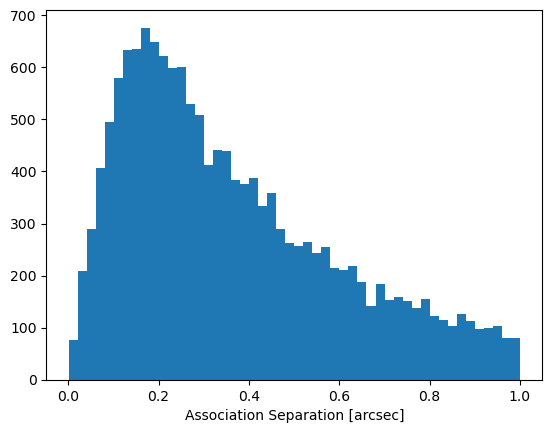

In [7]:
plt.hist(g_tab['association_separation_arcsec'], bins=50)
plt.xlabel('Association Separation [arcsec]')
plt.show()

/var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/ipykernel_38439/2294796586.py:5: RuntimeWarning: overflow encountered in power
  flux = 10 ** ((mag - zero_point) / -2.5)
/var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/ipykernel_38439/2294796586.py:13: RuntimeWarning: invalid value encountered in divide
  return flux / fluxerr


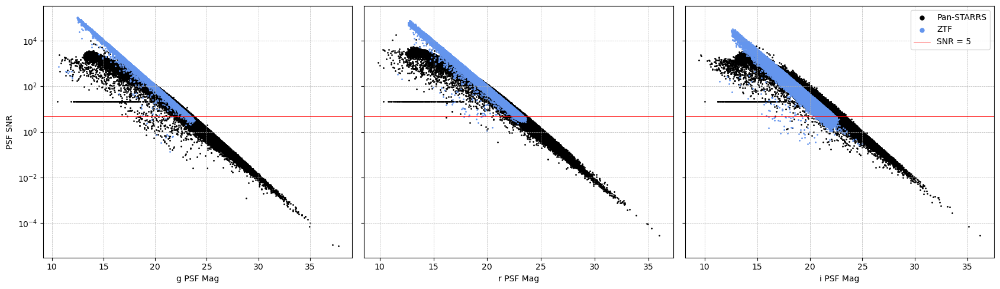

In [147]:
fig, axes = plt.subplots(1, 3, figsize=(17, 5), sharey=True)

for ax, band in zip(axes.flatten(), BANDS):

    # Get the band's table 
    tab = tables[band]

    # Calculate SNRs
    pstarr_snr = get_snr_from_mag(tab[f'PSTARR_{band}PSFMag'], tab[f'PSTARR_{band}PSFMagErr'], zp=25)  #TODO: Check zero points
    ztf_snr = get_snr_from_mag(tab[f'ZTF_{band}PSFMag'], tab[f'ZTF_{band}PSFMagErr'], zp=tab[f'ZTF_{band}_zero_pt_mag'])

    # Plot
    ax.scatter(tab[f'PSTARR_{band}PSFMag'], pstarr_snr, color='k', label='Pan-STARRS', s=1)
    ax.scatter(tab[f'ZTF_{band}PSFMag'], ztf_snr, color='cornflowerblue', label='ZTF', s=1)

    # Formatting
    ax.set_yscale('log')
    ax.grid(lw=0.5, ls='--')
    ax.set_xlabel(f'{band} PSF Mag')
    ax.axhline(5, color='red', lw=0.5, label='SNR = 5')

axes[0].set_ylabel(f'PSF SNR')
axes[-1].legend(markerscale=5)
plt.tight_layout()
plt.show()

In [181]:
filt_test = get_snr_from_mag(filtered_tables['g'][f'PSTARR_{band}PSFMag'], filtered_tables['g'][f'PSTARR_{band}PSFMagErr'], zp=25)
test = get_snr_from_mag(tables['g'][f'PSTARR_{band}PSFMag'], tables['g'][f'PSTARR_{band}PSFMagErr'], zp=25)
np.nanmin(test), np.nanmin(filt_test)

/var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/ipykernel_38439/2294796586.py:5: RuntimeWarning: overflow encountered in power
  flux = 10 ** ((mag - zero_point) / -2.5)
/var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/ipykernel_38439/2294796586.py:13: RuntimeWarning: invalid value encountered in divide
  return flux / fluxerr


(-0.0010868230277859157, -0.0010868230277859155)

/var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/ipykernel_38439/2294796586.py:5: RuntimeWarning: overflow encountered in power
  flux = 10 ** ((mag - zero_point) / -2.5)
/var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/ipykernel_38439/2294796586.py:13: RuntimeWarning: invalid value encountered in divide
  return flux / fluxerr
/var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/ipykernel_38439/2300382084.py:15: RuntimeWarning: All-NaN slice encountered
  kron_snr = np.nanmax(kron_snr, axis=0)


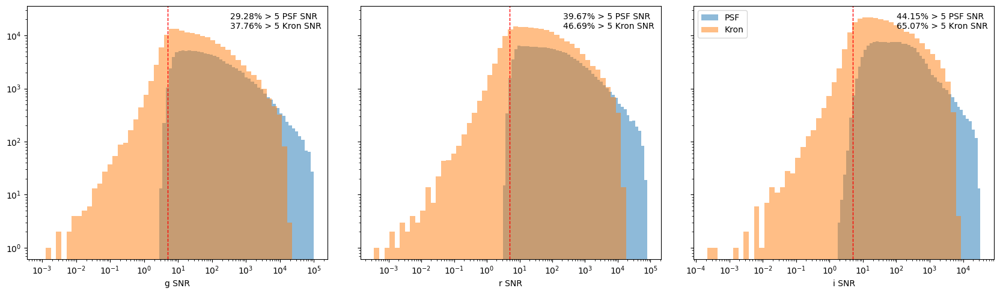

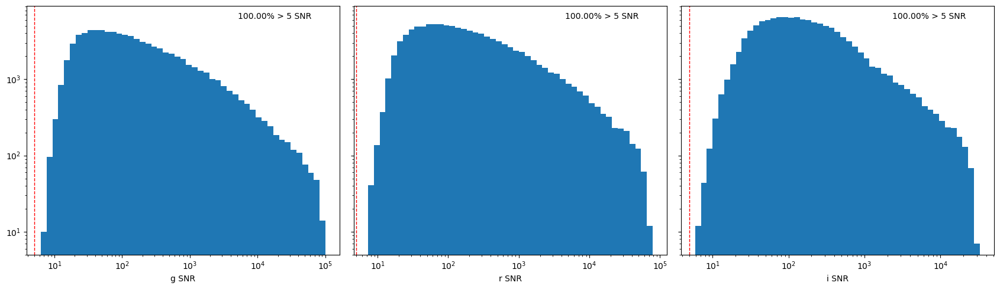

/var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/ipykernel_38439/2300382084.py:76: RuntimeWarning: All-NaN slice encountered
  kron_snr = np.nanmax(kron_snr, axis=0)
/var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/ipykernel_38439/2300382084.py:77: RuntimeWarning: All-NaN slice encountered
  snr = np.nanmax(np.vstack([psf_snr, kron_snr]), axis=0)


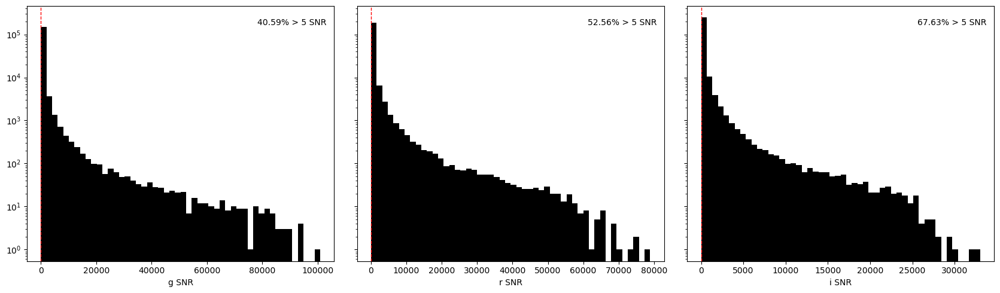

In [221]:
fig, axes = plt.subplots(1, 3, figsize=(17, 5), sharey=True)
for ax, band in zip(axes.flatten(), BANDS):

    # Get the band's table 
    tab = tables[band]

    # Calculate SNRs
    pstarr_snr = get_snr_from_mag(tab[f'PSTARR_{band}PSFMag'], tab[f'PSTARR_{band}PSFMagErr'], zp=25)  #TODO: Check zero points
    ztf_snr = get_snr_from_mag(tab[f'ZTF_{band}PSFMag'], tab[f'ZTF_{band}PSFMagErr'], zp=tab[f'ZTF_{band}_zero_pt_mag'])
    psf_snr = np.vstack([pstarr_snr, ztf_snr])
    psf_snr = np.max(psf_snr, axis=0)
    pstarr_snr = get_snr_from_mag(tab[f'PSTARR_{band}KronMag'], tab[f'PSTARR_{band}KronMagErr'], zp=25)  #TODO: Check zero points
    ztf_snr = get_snr_from_mag(tab[f'ZTF_{band}KronMag'], tab[f'ZTF_{band}KronMagErr'], zp=tab[f'ZTF_{band}_zero_pt_mag'])
    kron_snr = np.vstack([pstarr_snr, ztf_snr])
    kron_snr = np.nanmax(kron_snr, axis=0)

    # Formatting
    ax.hist(psf_snr, bins=np.logspace(np.log10(np.nanmin(psf_snr)), np.log10(np.nanmax(psf_snr)), base=10, num=50), alpha=0.5, label='PSF')
    ax.hist(kron_snr, bins=np.logspace(np.log10(np.nanmin(kron_snr)), np.log10(np.nanmax(kron_snr)), base=10, num=50), alpha=0.5, label='Kron')
    ax.set_xlabel(f'{band} SNR')
    ax.set_xscale('log')
    ax.set_yscale('log')
    ax.axvline(5, color='r', lw=1, ls='--')
    ax.text(0.675, 0.975, f'{np.sum(psf_snr > 5) / len(psf_snr) * 100:.2f}% > 5 PSF SNR\n{np.sum(kron_snr > 5) / len(kron_snr) * 100:.2f}% > 5 Kron SNR', transform=ax.transAxes, ha='left', va='top')

axes[-1].legend()
plt.tight_layout()
plt.show()



fig, axes = plt.subplots(1, 3, figsize=(17, 5), sharey=True)
for ax, band in zip(axes.flatten(), BANDS):

    # Get the band's table 
    tab = filtered_tables[band]

    # Calculate SNRs
    pstarr_snr = get_snr_from_mag(tab[f'PSTARR_{band}PSFMag'], tab[f'PSTARR_{band}PSFMagErr'], zp=25)  #TODO: Check zero points
    ztf_snr = get_snr_from_mag(tab[f'ZTF_{band}PSFMag'], tab[f'ZTF_{band}PSFMagErr'], zp=tab[f'ZTF_{band}_zero_pt_mag'])
    psf_snr = np.vstack([pstarr_snr, ztf_snr])
    psf_snr = np.nanmax(psf_snr, axis=0)
    pstarr_snr = get_snr_from_mag(tab[f'PSTARR_{band}KronMag'], tab[f'PSTARR_{band}KronMagErr'], zp=25)  #TODO: Check zero points
    ztf_snr = get_snr_from_mag(tab[f'ZTF_{band}KronMag'], tab[f'ZTF_{band}KronMagErr'], zp=tab[f'ZTF_{band}_zero_pt_mag'])
    kron_snr = np.vstack([pstarr_snr, ztf_snr])
    kron_snr = np.nanmax(kron_snr, axis=0)
    snr = np.nanmax(np.vstack([psf_snr, kron_snr]), axis=0)

    # Formatting
    ax.hist(snr, bins=np.logspace(np.log10(np.nanmin(snr)), np.log10(np.nanmax(snr)), base=10, num=50))
    ax.set_xlabel(f'{band} SNR')
    ax.set_xscale('log')
    ax.set_yscale('log')
    ax.axvline(5, color='r', lw=1, ls='--')
    ax.text(0.675, 0.975, f'{np.sum(snr > 5) / len(snr) * 100:.2f}% > 5 SNR', transform=ax.transAxes, ha='left', va='top')

plt.tight_layout()
plt.show()



fig, axes = plt.subplots(1, 3, figsize=(17, 5), sharey=True)
for ax, band in zip(axes.flatten(), BANDS):

    # Get the band's table 
    tab = tables[band]

    # Calculate SNRs
    pstarr_snr = get_snr_from_mag(tab[f'PSTARR_{band}PSFMag'], tab[f'PSTARR_{band}PSFMagErr'], zp=25)  #TODO: Check zero points
    ztf_snr = get_snr_from_mag(tab[f'ZTF_{band}PSFMag'], tab[f'ZTF_{band}PSFMagErr'], zp=tab[f'ZTF_{band}_zero_pt_mag'])
    psf_snr = np.vstack([pstarr_snr, ztf_snr])
    psf_snr = np.max(psf_snr, axis=0)
    pstarr_snr = get_snr_from_mag(tab[f'PSTARR_{band}KronMag'], tab[f'PSTARR_{band}KronMagErr'], zp=25)  #TODO: Check zero points
    ztf_snr = get_snr_from_mag(tab[f'ZTF_{band}KronMag'], tab[f'ZTF_{band}KronMagErr'], zp=tab[f'ZTF_{band}_zero_pt_mag'])
    kron_snr = np.vstack([pstarr_snr, ztf_snr])
    kron_snr = np.nanmax(kron_snr, axis=0)
    snr = np.nanmax(np.vstack([psf_snr, kron_snr]), axis=0)

    # Formatting
    ax.hist(snr, color='k', bins=50)
    ax.set_xlabel(f'{band} SNR')
    ax.set_yscale('log')
    ax.axvline(5, color='r', lw=1, ls='--')
    ax.text(0.75, 0.95, f'{np.sum(snr > 5) / len(snr) * 100:.2f}% > 5 SNR', transform=ax.transAxes, ha='left', va='top')

plt.tight_layout()
plt.show()

## Photometry Comparison & Point Source Metrics

/var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/ipykernel_20026/2294796586.py:5: RuntimeWarning: overflow encountered in power
  flux = 10 ** ((mag - zero_point) / -2.5)
/var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/ipykernel_20026/2294796586.py:13: RuntimeWarning: invalid value encountered in divide
  return flux / fluxerr
/var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/ipykernel_20026/4245767528.py:43: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.tight_layout()


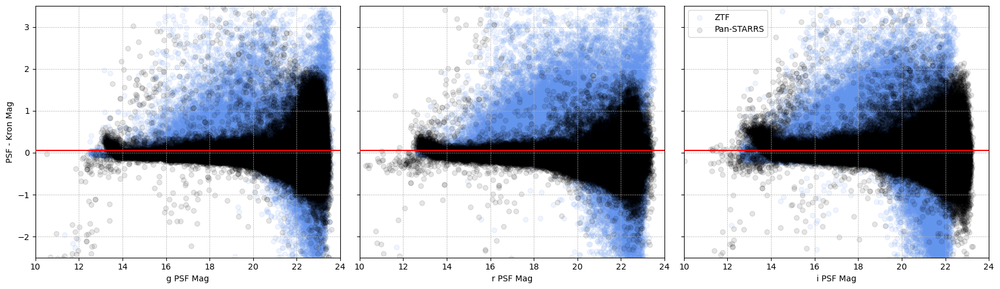

In [53]:
fig, axes = plt.subplots(1, 3, figsize=(17, 5), sharey=True)

for ax, band in zip(axes.flatten(), BANDS):

    # Get the band's table 
    tab = filtered_tables[band]

    # Calculate SNRs
    pstarr_snr = get_snr_from_mag(tab[f'PSTARR_{band}PSFMag'], tab[f'PSTARR_{band}PSFMagErr'], zp=25)  #TODO: Check zero points
    ztf_snr = get_snr_from_mag(tab[f'ZTF_{band}PSFMag'], tab[f'ZTF_{band}PSFMagErr'], zp=tab[f'ZTF_{band}_zero_pt_mag'])

    ##### BOTH #####
    # Masks
    pstarr_mask = pstarr_snr > 2
    ztf_mask = ztf_snr > 2

    # Plot
    # Without upper lims
    ax.scatter(
        tab[ztf_mask][f'ZTF_{band}PSFMag'],
        tab[ztf_mask][f'ZTF_{band}PSFMag'] - tab[ztf_mask][f'ZTF_{band}KronMag'],
        color='cornflowerblue',
        label='ZTF',
        alpha=0.1
    )
    ax.scatter(
        tab[pstarr_mask][f'PSTARR_{band}PSFMag'],
        tab[pstarr_mask][f'PSTARR_{band}PSFMag'] - tab[pstarr_mask][f'PSTARR_{band}KronMag'],
        color='k',
        label='Pan-STARRS',
        alpha=0.1
    )

    # Formatting
    ax.axhline(0.05, color='red', zorder=10)
    ax.grid(lw=0.5, ls='--')
    ax.set_xlabel(f'{band} PSF Mag')
    ax.set_ylim((-2.5, 3.5))
    ax.set_xlim((10, 24))

axes[0].set_ylabel(f'PSF - Kron Mag')
axes[-1].legend(markerscale=1)
plt.tight_layout()
plt.show()

In [15]:
tab = tables['g'].copy()
pstarr_snr = get_snr_from_mag(tab[f'PSTARR_gPSFMag'], tab[f'PSTARR_gPSFMagErr'], zp=25)
ztf_snr = get_snr_from_mag(tab[f'ZTF_gPSFMag'], tab[f'ZTF_gPSFMagErr'], zp=25)
mask = (pstarr_snr > 6) | (ztf_snr > 6)
tab = tab[mask]

with open('/Users/adamboesky/Desktop/ZTF_unassociated.txt', 'w') as f:
    for x, y in zip(tab[(tab['Catalog_Flag'] == 1)]['x'], tab[(tab['Catalog_Flag'] == 1)]['y']):
        f.write(f"{x} {y}\n")

with open('/Users/adamboesky/Desktop/PSTARR_unassociated.txt', 'w') as f:
    for x, y in zip(tab[(tab['Catalog_Flag'] == 2)]['x'], tab[(tab['Catalog_Flag'] == 2)]['y']):
        f.write(f"{x} {y}\n")

with open('/Users/adamboesky/Desktop/associated.txt', 'w') as f:
    for x, y in zip(tab[(tab['Catalog_Flag'] == 0)]['x'], tab[(tab['Catalog_Flag'] == 0)]['y']):
        f.write(f"{x} {y}\n")

/var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/ipykernel_76181/2294796586.py:5: RuntimeWarning: overflow encountered in power
  flux = 10 ** ((mag - zero_point) / -2.5)
/var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/ipykernel_76181/2294796586.py:13: RuntimeWarning: invalid value encountered in divide
  return flux / fluxerr


Table size: 13509
	Only in PSTARRS: 6560
	Only in ZTF: 0

Table size: 19098
	Only in PSTARRS: 5222
	Only in ZTF: 0

Table size: 23825
	Only in PSTARRS: 10927
	Only in ZTF: 0



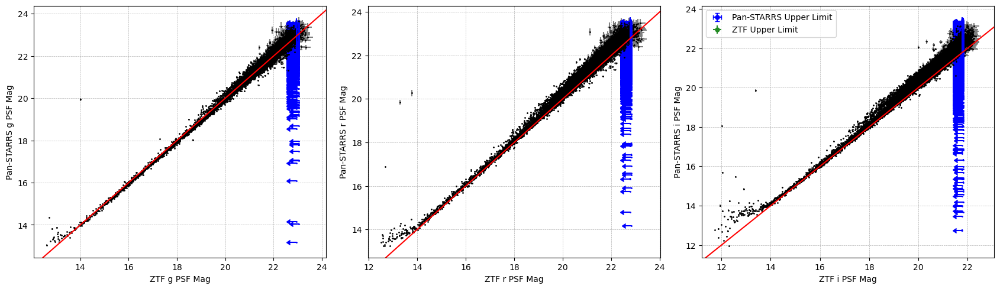

In [36]:
fig, axes = plt.subplots(1, 3, figsize=(17, 5))

for ax, band in zip(axes.flatten(), BANDS):

    # Get the band's table 
    tab = filtered_tables[band]
    print(f'Table size: {len(tab)}')

    ##### BOTH #####
    # Masks
    both_mask = (tab['Catalog'] == 'Both') & (tab[f'PSTARR_{band}PSFMag'] != -999) & (tab[f'ZTF_{band}PSFFlags'] == 0)
    ztf_upper_lim_mask = tab[f'ZTF_{band}_upper_lim_flag']

    # Plot
    # Without upper lims
    mask = both_mask & ~ztf_upper_lim_mask
    ax.errorbar(
        tab[mask][f'ZTF_{band}PSFMag'],
        tab[mask][f'PSTARR_{band}PSFMag'],
        xerr=tab[mask][f'ZTF_{band}PSFMagErr'],
        yerr=tab[mask][f'PSTARR_{band}PSFMagErr'],
        color='k',
        linestyle="None",
        fmt="o",
        markersize=1,
        ecolor='gray',
    )

    ##### Only in PSTARR #####
    # Mask
    mask = (tab['Catalog_Flag'] == 2) & (tab[f'PSTARR_{band}PSFMag'] != -999) & (tab[f'PSTARR_{band}PSFMagErr'] != -999)
    print(f'\tOnly in PSTARRS: {np.sum(mask)}')

    # Plot
    ax.errorbar(
        tab[mask][f'ZTF_{band}_mag_limit'],
        tab[mask][f'PSTARR_{band}PSFMag'],
        xerr=[0.25 for _ in range(np.sum(mask))],
        yerr=tab[mask][f'PSTARR_{band}PSFMagErr'],
        xuplims=True,
        color='blue',
        linestyle="None",
        fmt="o",
        markersize=1,
        label='Pan-STARRS Upper Limit',
    )

    ##### Only in ZTF #####
    # Mask
    mask = tab['Catalog_Flag'] == 1
    print(f'\tOnly in ZTF: {np.sum(mask)}\n')

    # Plot
    upper_lims = [UPPER_LIMIT_MAGS['pstarr'][band] for _ in range(np.sum(mask))]
    ax.errorbar(
        tab[mask][f'ZTF_{band}PSFMag'],
        upper_lims,
        yerr=[0.25 for _ in range(len(upper_lims))],
        xerr=tab[mask][f'ZTF_{band}PSFMagErr'],
        uplims=True,
        color='forestgreen',
        linestyle="None",
        fmt="o",
        markersize=1,
        label='ZTF Upper Limit',
    )

    # Formatting
    ax.axline((15, 15), slope=1, color='red', zorder=10)
    ax.grid(lw=0.5, ls='--')
    ax.set_ylabel(f'Pan-STARRS {band} PSF Mag')
    ax.set_xlabel(f'ZTF {band} PSF Mag')

axes[-1].legend(markerscale=5)
plt.tight_layout()
plt.show()

Table size: 178376


/var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/ipykernel_20026/2294796586.py:5: RuntimeWarning: overflow encountered in power
  flux = 10 ** ((mag - zero_point) / -2.5)
/var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/ipykernel_20026/2294796586.py:13: RuntimeWarning: invalid value encountered in divide
  return flux / fluxerr


Table size: 234485
Table size: 312160


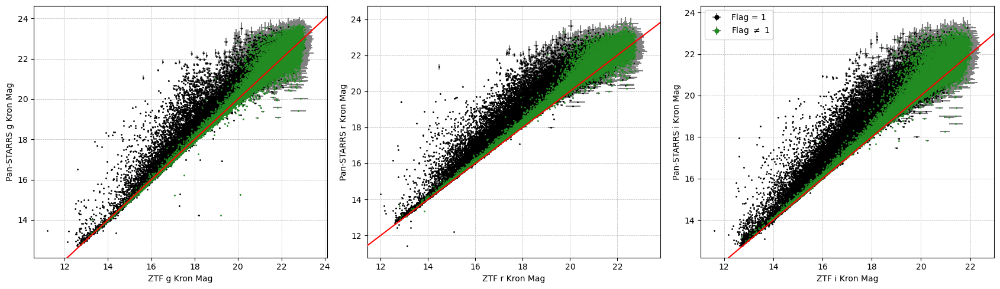

In [64]:
fig, axes = plt.subplots(1, 3, figsize=(17, 5))

for ax, band in zip(axes.flatten(), BANDS):

    # Get the band's table
    tab = filtered_tables[band]
    print(f'Table size: {len(tab)}')

    tab_1s = tab[tab['ZTF_sepExtractionFlag'] == 1]
    tab_not_1s = tab[tab['ZTF_sepExtractionFlag'] != 1]
    
    for tab, col, lab in zip([tab_1s, tab_not_1s], ['k', 'forestgreen'], ['Flag = 1', r'Flag $\neq$ 1']):

        # Calculate SNRs
        pstarr_snr = get_snr_from_mag(tab[f'PSTARR_{band}KronMag'], tab[f'PSTARR_{band}KronMagErr'], zp=25)  #TODO: Check zero points
        ztf_snr = get_snr_from_mag(tab[f'ZTF_{band}KronMag'], tab[f'ZTF_{band}KronMagErr'], zp=tab[f'ZTF_{band}_zero_pt_mag'])

        ##### BOTH #####
        # Masks
        both_mask = (tab['Catalog'] == 'Both') & (tab[f'PSTARR_{band}KronMag'] != -999)
        ztf_upper_lim_mask = tab[f'ZTF_{band}_upper_lim_flag']

        # Plot
        # Without upper lims
        mask = both_mask & (pstarr_snr > 3) & (ztf_snr > 3) & ~ztf_upper_lim_mask
        ax.errorbar(
            tab[mask][f'ZTF_{band}KronMag'],
            tab[mask][f'PSTARR_{band}KronMag'],
            xerr=tab[mask][f'ZTF_{band}KronMagErr'],
            yerr=tab[mask][f'PSTARR_{band}KronMagErr'],
            color=col,
            linestyle="None",
            fmt="o",
            markersize=1,
            ecolor='gray',
            label=lab,
        )
        # # Just upper lims
        # mask = both_mask & (pstarr_snr > 3) & ztf_upper_lim_mask
        # print(f'Plotting {np.sum(mask)} / {np.sum(ztf_upper_lim_mask)} upper limits')
        # ax.errorbar(
        #     tab[mask][f'ZTF_{band}PSFMag'],
        #     tab[mask][f'PSTARR_{band}PSFMag'],
        #     xerr=[0.25 for _ in range(np.sum(mask))],
        #     yerr=tab[mask][f'PSTARR_{band}PSFMagErr'],
        #     xuplims=True,
        #     color='k',
        #     linestyle="None",
        #     fmt="o",
        #     markersize=1,
        #     ecolor='gray',
        # )

        # ##### Only in PSTARR #####
        # # Mask
        # pstarr_mask = (tab['Catalog'] == 'PSTARR') & (tab[f'PSTARR_{band}PSFMag'] != -999) & (tab[f'PSTARR_{band}PSFMagErr'] != -999)
        # mask = pstarr_mask & (pstarr_snr > 3)

        # # Plot
        # upper_lims = [UPPER_LIMIT_MAGS['ztf'][band] for _ in range(np.sum(mask))]
        # ax.errorbar(
        #     upper_lims,
        #     tab[mask][f'PSTARR_{band}PSFMag'],
        #     xerr=[0.25 for _ in range(len(upper_lims))],
        #     yerr=tab[mask][f'PSTARR_{band}PSFMagErr'],
        #     xuplims=True,
        #     color='blue',
        #     linestyle="None",
        #     fmt="o",
        #     markersize=1,
        # )

        # ##### Only in ZTF #####
        # # Mask
        # ztf_mask = (tab['Catalog'] == 'ZTF')
        # mask = ztf_mask & (ztf_snr > 3)

        # # Plot
        # upper_lims = [UPPER_LIMIT_MAGS['pstarr'][band] for _ in range(np.sum(mask))]
        # ax.errorbar(
        #     tab[mask][f'ZTF_{band}PSFMag'],
        #     upper_lims,
        #     yerr=[0.25 for _ in range(len(upper_lims))],
        #     xerr=tab[mask][f'ZTF_{band}PSFMagErr'],
        #     uplims=True,
        #     color='forestgreen',
        #     linestyle="None",
        #     fmt="o",
        #     markersize=1,
        # )

    # Formatting
    ax.axline((15, 15), slope=1, color='red', zorder=10)
    ax.grid(lw=0.5, ls='--')
    ax.set_ylabel(f'Pan-STARRS {band} Kron Mag')
    ax.set_xlabel(f'ZTF {band} Kron Mag')

axes[-1].legend(markerscale=5)
plt.tight_layout()
plt.show()

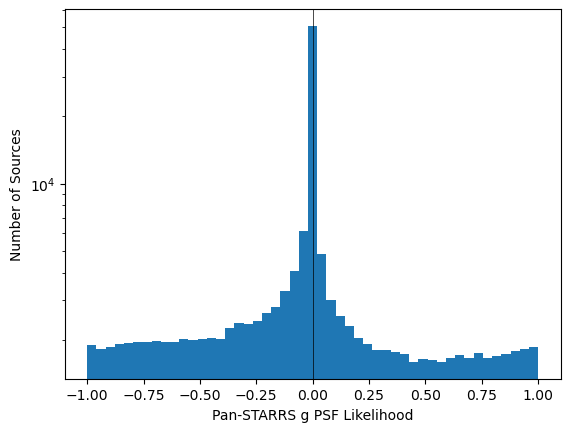

In [77]:
plt.hist(g_tab['PSTARR_gpsfLikelihood'][g_tab['PSTARR_gpsfLikelihood'] > -100], bins=np.linspace(-1, 1, 50))
plt.xlabel('Pan-STARRS g PSF Likelihood')
plt.ylabel('Number of Sources')
plt.yscale('log')
plt.axvline(0, color='k', lw=0.5)
plt.show()
# "This is around 0 for galaxies but can be either +1 or - 1 for stars"

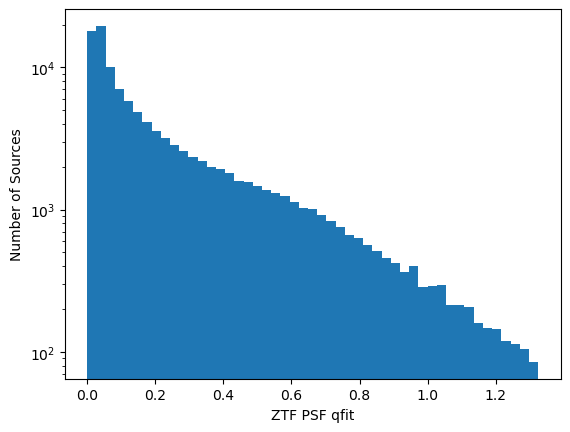

In [78]:
qfit_4sig_high = np.nanmean(g_tab['ZTF_qfit']) + 4 * np.nanstd(g_tab['ZTF_qfit'])
plt.hist(g_tab['ZTF_qfit'], bins=np.linspace(0, qfit_4sig_high, num=50))
plt.xlabel('ZTF PSF qfit')
plt.ylabel('Number of Sources')
plt.yscale('log')
plt.show()

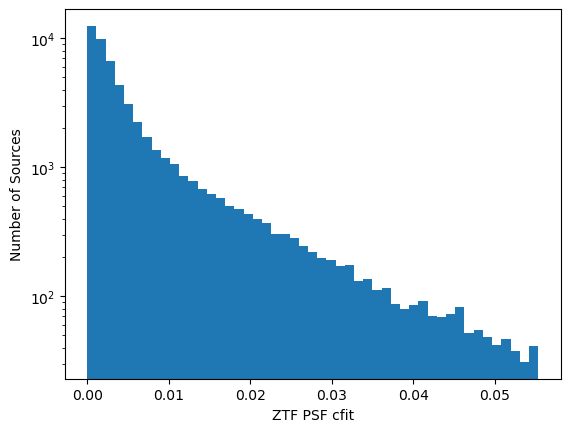

In [79]:
cfit_4sig_high = np.nanmean(g_tab['ZTF_cfit']) + 4 * np.nanstd(g_tab['ZTF_cfit'])
plt.hist(g_tab['ZTF_cfit'], bins=np.linspace(0, cfit_4sig_high, num=50))
plt.xlabel('ZTF PSF cfit')
plt.ylabel('Number of Sources')
plt.yscale('log')
plt.show()

Table size: 178376
Table size: 234485
Table size: 312160


/var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/ipykernel_38439/1369745647.py:19: UserWarning: No artists with labels found to put in legend.  Note that artists whose label start with an underscore are ignored when legend() is called with no argument.
  axes[-1].legend(markerscale=5)


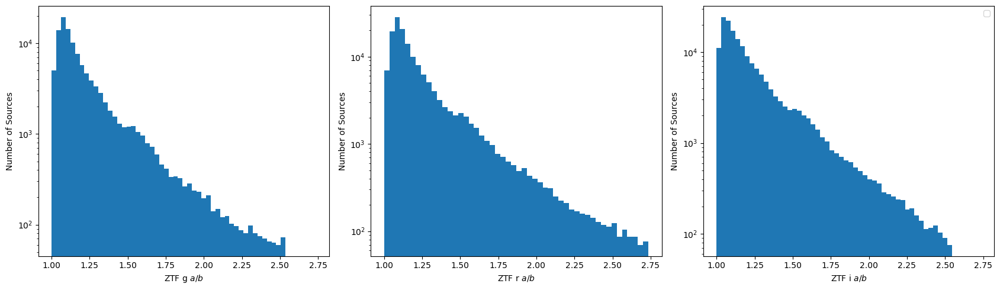

In [53]:
fig, axes = plt.subplots(1, 3, figsize=(17, 5), sharex=True)

for ax, band in zip(axes.flatten(), BANDS):

    # Get the band's table
    tab = filtered_tables[band]
    print(f'Table size: {len(tab)}')

    ##### BOTH #####
    axis_ratio = tab['ZTF_a'] / tab['ZTF_b']
    ratio_4sig_max = np.nanmean(axis_ratio) + 4 * np.nanstd(axis_ratio)
    ax.hist(axis_ratio[axis_ratio < ratio_4sig_max], bins=50)

    # Formatting
    ax.set_yscale('log')
    ax.set_ylabel(f'Number of Sources')
    ax.set_xlabel(rf'ZTF {band} $a/b$')

axes[-1].legend(markerscale=5)
plt.tight_layout()
plt.show()

Table size: 178376
Table size: 234485
Table size: 312160


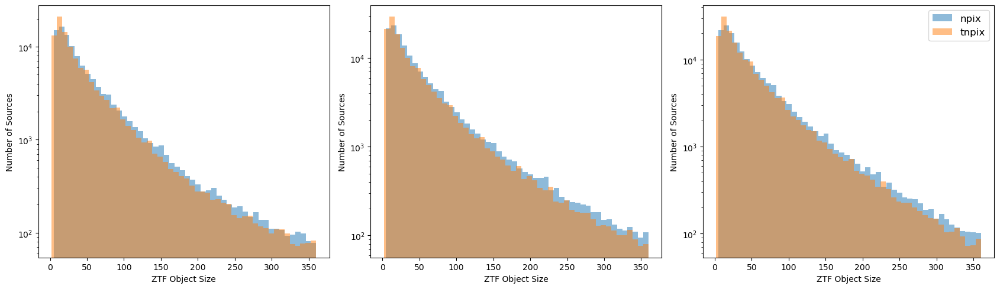

In [100]:
fig, axes = plt.subplots(1, 3, figsize=(17, 5), sharex=True)

for ax, band in zip(axes.flatten(), BANDS):

    # Get the band's table
    tab = filtered_tables[band]
    print(f'Table size: {len(tab)}')

    ##### BOTH #####
    npix = tab['ZTF_npix']
    npix_4sig_max = np.nanmean(npix) + 4 * np.nanstd(npix)
    ax.hist(npix[npix < ratio_4sig_max], bins=50, alpha=0.5, label='npix')

    npix = tab['ZTF_tnpix']
    npix_4sig_max = np.nanmean(npix) + 4 * np.nanstd(npix)
    ax.hist(npix[npix < ratio_4sig_max], bins=50, alpha=0.5, label='tnpix')

    # Formatting
    ax.set_yscale('log')
    ax.set_ylabel(f'Number of Sources')
    ax.set_xlabel(rf'ZTF Object Size')

axes[-1].legend(markerscale=5, fontsize=12)
plt.tight_layout()
plt.show()

In [56]:
ztf_tab = tile.ztf_catalogs['g'].sextractors['g'].get_data_table(include_psf=False)
ztf_tab

Extracting sources...
Calculating Kron magnitudes...


thresh,npix,tnpix,xmin,xmax,ymin,ymax,x,y,x2,y2,xy,errx2,erry2,errxy,a,b,theta,cxx,cyy,cxy,cflux,flux,cpeak,peak,xcpeak,ycpeak,xpeak,ypeak,sepExtractionFlag,KronRad,gKronMag,gKronMagErr,gKronCircleFlag,gKronFlag,ra,dec,g_zero_pt_mag,g_mag_limit
float64,int64,int64,int64,int64,int64,int64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,int64,int64,int64,int64,int64,float64,float64,float64,int64,int64,float64,float64,float64,float64
0.9679189324378967,12,2,416,419,69,71,417.4417231276625,69.99999998166275,0.7466038428250563,0.5000000091686233,2.6437233735521204e-08,0.00033179628758506517,0.00017733128276340427,2.776116691910293e-13,0.8640624284744263,0.7071067690849304,1.0720528109686711e-07,1.3393983840942383,2.0,-1.4163995842864097e-07,208.0299835205078,208.0299835205078,40.52103805541992,116.13832092285156,417,70,417,70,0,0.7397905531782774,17.42810685408394,0.0027332324060129337,1,32,96.00822520292866,13.541384757620653,26.325,22.7926998
0.9679189324378967,15,3,586,590,69,71,588.6213307763543,70.00535397006023,1.1259943417340095,0.5013098026896823,-0.012249880843343774,0.002542414709974613,0.0007131787356025577,3.3377972165996838e-06,1.0612419843673706,0.7078627347946167,-0.019599661231040955,0.8883401155471802,1.9953049421310425,0.043414510786533356,115.22459411621094,115.94432067871094,23.42926025390625,93.717041015625,589,70,589,70,0,0.6343340262670388,17.877558694342902,0.004081824224129887,1,32,96.05712430190816,13.542233005436378,26.325,22.7926998
0.9679189324378967,14,4,1047,1051,69,71,1048.6115661603135,70.0425459316697,1.560293196441084,0.4918247052337059,0.07849354873866776,0.023374164599046714,0.00786653314543845,0.0019705103146233924,1.251410722732544,0.6972008943557739,0.07294171303510666,0.6460925340652466,2.049701452255249,-0.2062283456325531,32.684322357177734,35.0751953125,4.805746078491211,16.181411743164062,1048,70,1048,70,0,2.0915786718913396,20.00272709479746,0.027023925464582904,0,32,96.18852853275239,13.544459026942821,26.325,22.7926998
0.9679189324378967,5,1,1089,1091,69,71,1090.0,70.0,0.33333333333333326,0.33333333333333326,0.0,0.04326784169875683,0.04326784169875683,0.0,0.5773502588272095,0.5773502588272095,0.7853981852531433,3.0,3.0,-0.0,6.587333679199219,8.783111572265625,2.1957778930664062,8.783111572265625,1090,70,1090,70,0,0.10509811919090636,21.021240372966417,0.07160669253601624,1,32,96.20035185148929,13.54466869940987,26.325,22.7926998
0.9679189324378967,25,9,1633,1640,69,72,1635.1832733532572,70.20392563970196,1.399289321605063,0.6609486628827188,-0.05172337573646457,0.000196823191160534,5.640050959689723e-05,-8.769262873443625e-06,1.184438705444336,0.8107668161392212,-0.06960047781467438,0.7167217135429382,1.5173660516738892,0.11217593401670456,703.7698364257812,706.7109985351562,101.7330093383789,213.70635986328125,1635,70,1635,70,0,0.9316316044816982,17.356852026594677,0.002537170775085162,1,32,96.35609910724698,13.547166455451416,26.325,22.7926998
0.9679189324378967,9,1,2318,2320,70,72,2318.9960500357947,71.00394990667591,0.5019593798854008,0.5019593803398752,-0.003934304685927259,0.005140070787667872,0.005140070784181704,-3.2427779948961956e-07,0.711262047290802,0.705708920955658,-0.7853981852531433,1.992315411567688,1.992315411567688,0.031231116503477097,33.15436553955078,33.023406982421875,8.255851745605469,33.023406982421875,2319,71,2319,71,0,0.40733070501942237,19.801220872146406,0.023350303453139355,1,32,96.55145637682801,13.550011875515995,26.325,22.7926998
0.9679189324378967,19,4,783,787,69,73,785.3768695854001,70.14317789042887,0.9554183942995902,0.7427691015142686,-0.05582210826093892,0.0014200871441567887,0.0011786086923363177,-9.675021913259059e-05,0.9844700694084167,0.8538185358047485,-0.24172964692115784,1.051277995109558,1.3522511720657349,0.15801560878753662,151.88055419921875,153.05679321289062,24.72500991821289,74.35317993164062,786,70,786,70,0,0.8834469828828605,18.57512402

Calculating Kron magnitudes...


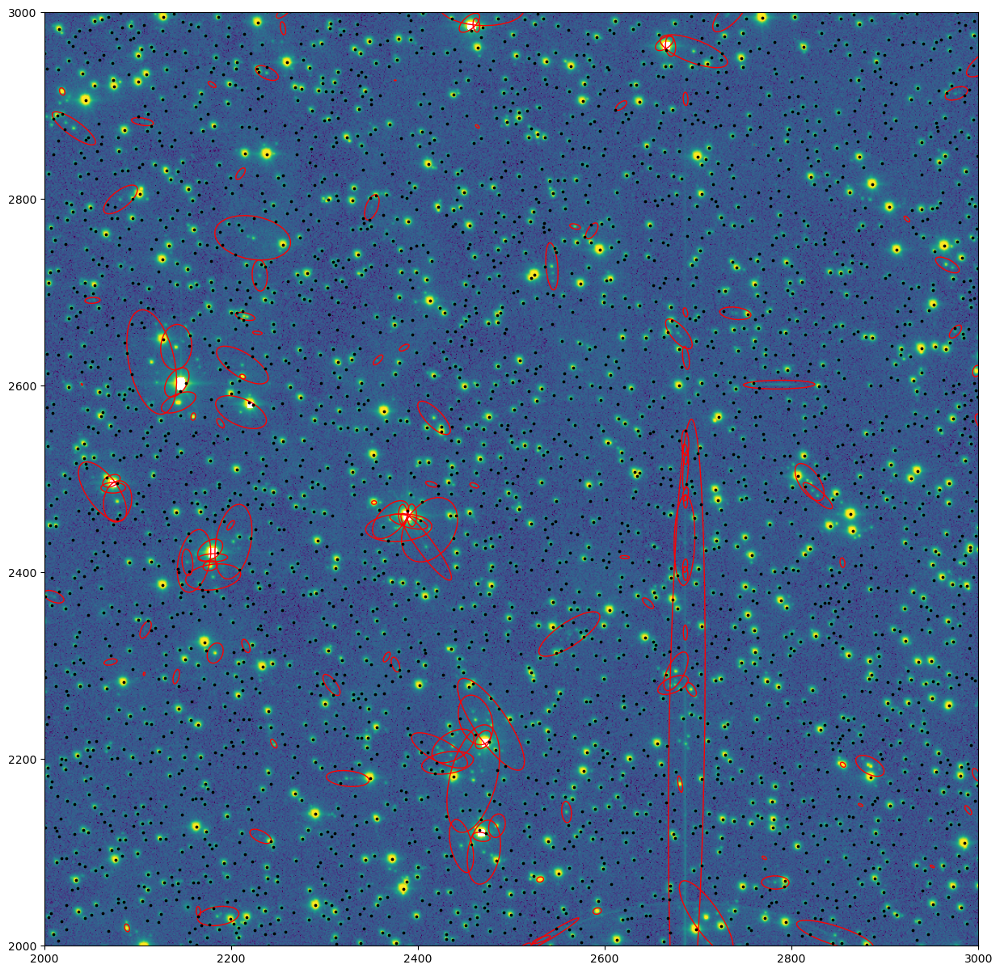

In [109]:
# Masking for shape
good_shape_mask = (ztf_tab['a'] / ztf_tab['b']) < 2                                                 # a/b < 1.75
good_shape_mask &= np.logical_or((ztf_tab['a'] / ztf_tab['b']) < 1.35, ztf_tab['tnpix'] < 200)      # a/b < 1.5 for big sources

# Plot
tile.ztf_catalogs['g'].sextractors['g'].plot_segmap(
    show_source_shapes=True,
    source_mask=~good_shape_mask,
    image_is_subtracted=True,
    show_sources=False,
)
plt.scatter(ztf_tab['x'][good_shape_mask], ztf_tab['y'][good_shape_mask], color='k', s=3)
plt.xlim((2000, 3000))
plt.ylim((2000, 3000))
plt.show()

# Identify Changing Sources

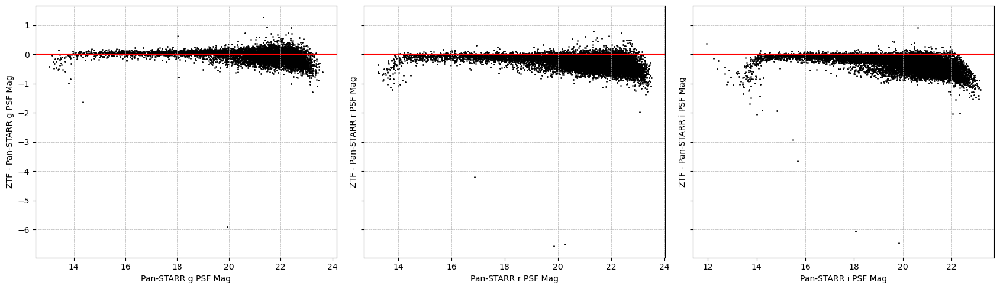

In [15]:
fig, axes = plt.subplots(1, 3, figsize=(17, 5), sharey=True)

for ax, band in zip(axes.flatten(), BANDS):

    # Get the band's table 
    tab = filtered_tables[band]

    # pstarr_snr = get_snr_from_mag(tab[f'PSTARR_{band}PSFMag'], tab[f'PSTARR_{band}PSFMagErr'], zp=25)  #TODO: Check zero points
    # ztf_snr = get_snr_from_mag(tab[f'ZTF_{band}PSFMag'], tab[f'ZTF_{band}PSFMagErr'], zp=tab[f'ZTF_{band}_zero_pt_mag'])

    ##### BOTH #####
    # Masks
    both_mask = (tab['Catalog'] == 'Both') & (tab[f'PSTARR_{band}PSFMag'] != -999) & (tab[f'ZTF_{band}PSFFlags'] == 0)

    # Plot
    mask = both_mask
    ax.scatter(
        tab[mask][f'PSTARR_{band}PSFMag'],
        tab[mask][f'ZTF_{band}PSFMag'] - tab[mask][f'PSTARR_{band}PSFMag'],
        color='k',
        s=1,
    )

    # Formatting
    ax.axhline(0, color='red', zorder=10)
    ax.grid(lw=0.5, ls='--')
    ax.set_ylabel(f'ZTF - Pan-STARR {band} PSF Mag')
    ax.set_xlabel(f'Pan-STARR {band} PSF Mag')

ylims = np.array([ax.get_ylim() for ax in axes])
for ax in axes:
    ax.set_ylim(np.min(ylims), np.max(ylims))

plt.tight_layout()
plt.show()

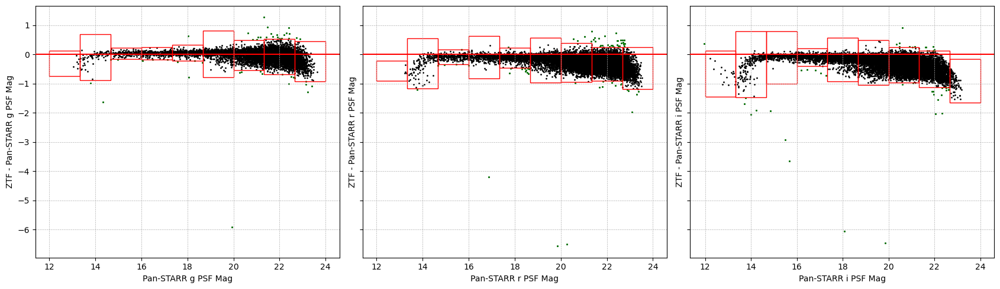

In [37]:
fig, axes = plt.subplots(1, 3, figsize=(17, 5), sharey=True)

bin_means = {}
bin_stds = {}
outside_masks = {}
for ax, band in zip(axes.flatten(), BANDS):

    # Get the band's table 
    tab = filtered_tables[band]
    outside_masks[band] = np.ones(len(tab), dtype=bool)

    ##### BOTH #####
    # Masks
    both_mask = (tab['Catalog_Flag'] == 0) & (tab[f'PSTARR_{band}PSFMag'] != -999)
    outside_masks[band] &= both_mask

    # Get the 3-sigma boundaries on delta mag
    mag_bin_edges = np.linspace(12, 24, num=10)
    bin_means[band], bin_stds[band] = [], []
    for i in range(len(mag_bin_edges) - 1):
        lower, upper = mag_bin_edges[i], mag_bin_edges[i+1]
        bin_mask = both_mask & (tab[f'PSTARR_{band}PSFMag'] > lower) & (tab[f'PSTARR_{band}PSFMag'] < upper)
        bin_means[band].append(np.nanmean(tab[bin_mask][f"ZTF_{band}PSFMag"] - tab[bin_mask][f"PSTARR_{band}PSFMag"]))
        bin_stds[band].append(np.nanstd(tab[bin_mask][f"ZTF_{band}PSFMag"] - tab[bin_mask][f"PSTARR_{band}PSFMag"]))

        outside_masks[band][bin_mask] = np.abs(tab[bin_mask][f"ZTF_{band}PSFMag"] - tab[bin_mask][f"PSTARR_{band}PSFMag"] - bin_means[band][-1]) > 3 * bin_stds[band][-1]

    # Plot
    ax.scatter(
        tab[both_mask][f'PSTARR_{band}PSFMag'],
        tab[both_mask][f'ZTF_{band}PSFMag'] - tab[both_mask][f'PSTARR_{band}PSFMag'],
        color='k',
        s=1,
    )
    ax.scatter(
        tab[outside_masks[band]][f'PSTARR_{band}PSFMag'],
        tab[outside_masks[band]][f'ZTF_{band}PSFMag'] - tab[outside_masks[band]][f'PSTARR_{band}PSFMag'],
        color='green',
        s=1,
    )

    # Plot the bin mean +- 3sigma with rectangles for each bin
    for lower, upper, mean, std in zip(mag_bin_edges[:-1], mag_bin_edges[1:], bin_means[band], bin_stds[band]):
        rect = plt.Rectangle(
            (lower, mean - (3 * std)),
            upper - lower,
            6 * std,
            color='red',
            lw=1.0,
            fc="none",
        )
        ax.add_patch(rect)

    # Formatting
    ax.axhline(0, color='red', zorder=10)
    ax.grid(lw=0.5, ls='--')
    ax.set_ylabel(f'ZTF - Pan-STARR {band} PSF Mag')
    ax.set_xlabel(f'Pan-STARR {band} PSF Mag')

ylims = np.array([ax.get_ylim() for ax in axes])
for ax in axes:
    ax.set_ylim(np.min(ylims), np.max(ylims))

plt.tight_layout()
plt.show()

In [38]:
changing_tables = {}
for band in BANDS:

    # Get the band's table
    tab = filtered_tables[band].copy()
    changing_tables[band] = tab[outside_masks[band]]

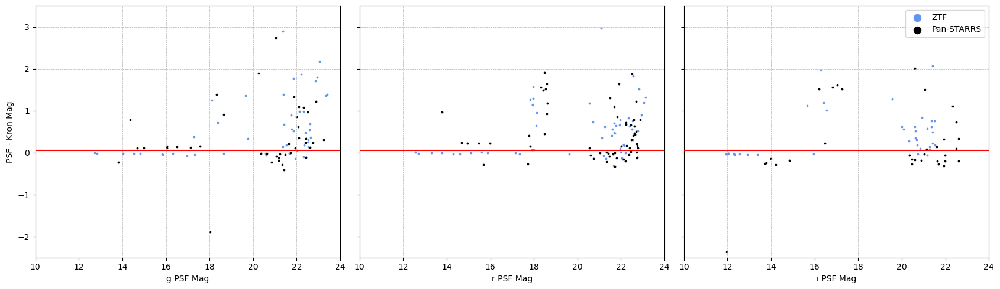

In [39]:
fig, axes = plt.subplots(1, 3, figsize=(17, 5), sharey=True)

for ax, band in zip(axes.flatten(), BANDS):

    # Get the band's table 
    tab = changing_tables[band]

    ##### BOTH #####

    # Plot
    # Without upper lims
    ax.scatter(
        tab[f'ZTF_{band}PSFMag'],
        tab[f'ZTF_{band}PSFMag'] - tab[f'ZTF_{band}KronMag'],
        color='cornflowerblue',
        label='ZTF',
        s=3,
    )
    ax.scatter(
        tab[f'PSTARR_{band}PSFMag'],
        tab[f'PSTARR_{band}PSFMag'] - tab[f'PSTARR_{band}KronMag'],
        color='k',
        label='Pan-STARRS',
        s=3,
    )

    # Formatting
    ax.axhline(0.05, color='red', zorder=10)
    ax.grid(lw=0.5, ls='--')
    ax.set_xlabel(f'{band} PSF Mag')
    ax.set_ylim((-2.5, 3.5))
    ax.set_xlim((10, 24))

axes[0].set_ylabel(f'PSF - Kron Mag')
axes[-1].legend(markerscale=5)
plt.tight_layout()
plt.show()

In [40]:
for ax, band in zip(axes.flatten(), BANDS):

    # Get the band's table
    ztf_dmag_ps = (changing_tables[band][f'ZTF_{band}PSFMag'] - changing_tables[band][f'ZTF_{band}KronMag'])
    pstarr_dmag_ps = (changing_tables[band][f'PSTARR_{band}PSFMag'] - changing_tables[band][f'PSTARR_{band}KronMag'])
    changing_tables[band] = changing_tables[band][
        np.logical_and(
            (ztf_dmag_ps < 0.05) | (pstarr_dmag_ps < 0.05),
            ~np.isnan(ztf_dmag_ps) & ~np.isnan(pstarr_dmag_ps)
        )
    ]

In [41]:
changing_tables['g']

ra,dec,ZTF_thresh,ZTF_npix,ZTF_tnpix,ZTF_xmin,ZTF_xmax,ZTF_ymin,ZTF_ymax,ZTF_x,ZTF_y,ZTF_x2,ZTF_y2,ZTF_xy,ZTF_errx2,ZTF_erry2,ZTF_errxy,ZTF_a,ZTF_b,ZTF_theta,ZTF_cxx,ZTF_cyy,ZTF_cxy,ZTF_cflux,ZTF_flux,ZTF_cpeak,ZTF_peak,ZTF_xcpeak,ZTF_ycpeak,ZTF_xpeak,ZTF_ypeak,ZTF_sepExtractionFlag,ZTF_KronRad,ZTF_gKronMag,ZTF_gKronMagErr,ZTF_gKronCircleFlag,ZTF_gKronFlag,ZTF_gPSFMag,ZTF_gPSFMagErr,ZTF_gPSFFlags,ZTF_qfit,ZTF_cfit,ZTF_g_zero_pt_mag,ZTF_g_mag_limit,ZTF_ra,ZTF_dec,PSTARR_PanSTARR_ID,PSTARR_gKronMag,PSTARR_rKronMag,PSTARR_iKronMag,PSTARR_gKronMagErr,PSTARR_rKronMagErr,PSTARR_iKronMagErr,PSTARR_gApMag,PSTARR_rApMag,PSTARR_iApMag,PSTARR_gApMagErr,PSTARR_rApMagErr,PSTARR_iApMagErr,PSTARR_gPSFMag,PSTARR_rPSFMag,PSTARR_iPSFMag,PSTARR_gPSFMagErr,PSTARR_rPSFMagErr,PSTARR_iPSFMagErr,PSTARR_gpsfLikelihood,PSTARR_rpsfLikelihood,PSTARR_ipsfLikelihood,PSTARR_primaryDetection,PSTARR_ra,PSTARR_dec,association_separation_arcsec,Catalog,Catalog_Flag,x,y,ZTF_g_upper_lim_flag
float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,str6,int64,float64,float64,bool
5.083195363821143,9.290408451624687,0.850922703742981,208.0,188.0,1359.0,1378.0,149.0,165.0,1368.7933339378972,157.06033791699682,2.1845438310158585,2.165070195453964,-0.14703391687352507,1.1470224073686255e-05,1.0054298473811465e-05,-1.4837454710966062e-07,1.523864507675171,1.4238859415054321,-0.7523356676101685,0.45986345410346985,0.4639996886253357,0.06246035546064377,15840.4599609375,15857.4951171875,1691.365478515625,3016.85986328125,1369.0,157.0,1369.0,157.0,0.0,0.964913051863113,15.854948342107646,0.0006161077656988356,1.0,0.0,15.828253755681734,0.00020351431484018275,0.0,0.02580734383327566,0.001486899432087311,26.325,22.9347992,5.002725503223463,9.698823537165072,1.196300500274591e+17,15.8846998214722,15.3397998809814,15.1076002120972,0.0011060000397265,0.000381999998353422,0.000475000008009374,15.8528995513916,15.2706003189087,15.0353002548218,0.000584999972488731,0.000379000004613772,0.000345999986166134,16.0445003509521,15.2629995346069,15.0318002700806,0.00139099999796599,0.000390000001061708,0.000487999990582466,7.81659982749261e-05,0.970299005508423,-0.769195020198822,1.0,5.002764985518,9.69885846718421,0.18826019439456132,Both,0,1368.7933339378972,157.06033791699682,False
5.083195363821143,9.290408451624687,0.850922703742981,210.0,193.0,941.0,961.0,479.0,495.0,950.0079884357021,486.93837274574946,2.2122633447856117,2.081693777102444,-0.116156854305828,1.4285442755138645e-05,9.466991304922016e-06,2.462098004791306e-07,1.5100412368774414,1.419060468673706,-0.5293782353401184,0.45335397124290466,0.48178958892822266,0.050593581050634384,15297.875,15314.5234375,1632.4150390625,2886.393798828125,950.0,487.0,950.0,487.0,1.0,0.9481716353735159,15.88979690828427,0.0006327044661420734,1.0,0.0,15.844741787886026,0.00021233798456115428,0.0,0.03431907126023269,0.0048797892311878525,26.325,22.9347992,4.883638233707082,9.608573733535723,1.1953004883675082e+17,15.9340000152588,14.9897003173828,14.6308002471924,0.00123900000471622,0.000404999998863786,0.000375000003259629,15.8896999359131,14.9427995681763,14.5637998580933,0.000594999990426004,0.00032600000849925,0.000277999992249534,16.0414009094238,15.0,14.6056995391846,0.00141100003384054,0.000441000011051074,0.000418000010540709,0.00201412010937929,0.156204998493195,0.0485347993671894,1.0,4.88366071003734,9.60860114269116,0.12689028161199048,Both,0,950.0079884357021,486.93837274574946,False
5.083195363821143,9.290408451624687,0

In [42]:
# Sort the tables by dmag
for band in ('g', 'r', 'i'):
    dmag = changing_tables[band][f'ZTF_{band}PSFMag'] - changing_tables[band][f'PSTARR_{band}PSFMag']
    changing_tables[band]['dmag'] = dmag
    changing_tables[band] = changing_tables[band][np.argsort(np.abs(dmag))[::-1]]

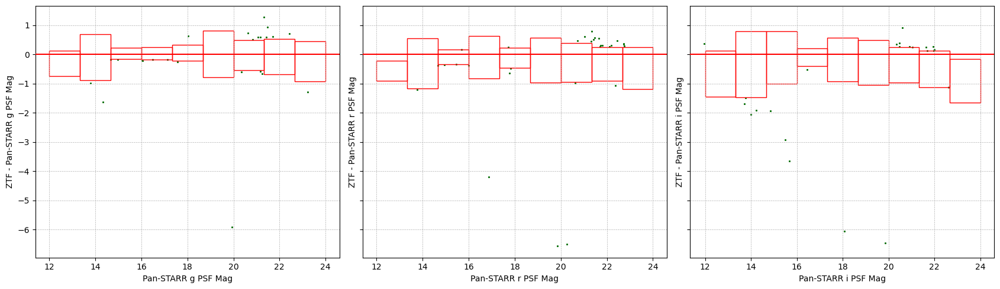

In [43]:
fig, axes = plt.subplots(1, 3, figsize=(17, 5), sharey=True)

for ax, band in zip(axes.flatten(), BANDS):

    # Get the band's table 
    tab = changing_tables[band]
    outside_masks[band] = np.ones(len(tab), dtype=bool)

    ##### BOTH #####
    # Masks
    both_mask = (tab['Catalog_Flag'] == 0) & (tab[f'PSTARR_{band}PSFMag'] != -999)
    outside_masks[band] &= both_mask

    # Plot
    ax.scatter(
        tab[both_mask][f'PSTARR_{band}PSFMag'],
        tab[both_mask][f'ZTF_{band}PSFMag'] - tab[both_mask][f'PSTARR_{band}PSFMag'],
        color='k',
        s=1,
    )
    ax.scatter(
        tab[outside_masks[band]][f'PSTARR_{band}PSFMag'],
        tab[outside_masks[band]][f'ZTF_{band}PSFMag'] - tab[outside_masks[band]][f'PSTARR_{band}PSFMag'],
        color='green',
        s=1,
    )

    # Plot the bin mean +- 3sigma with rectangles for each bin
    for lower, upper, mean, std in zip(mag_bin_edges[:-1], mag_bin_edges[1:], bin_means[band], bin_stds[band]):
        rect = plt.Rectangle(
            (lower, mean - (3 * std)),
            upper - lower,
            6 * std,
            color='red',
            lw=1.0,
            fc="none",
        )
        ax.add_patch(rect)

    # Formatting
    ax.axhline(0, color='red', zorder=10)
    ax.grid(lw=0.5, ls='--')
    ax.set_ylabel(f'ZTF - Pan-STARR {band} PSF Mag')
    ax.set_xlabel(f'Pan-STARR {band} PSF Mag')

ylims = np.array([ax.get_ylim() for ax in axes])
for ax in axes:
    ax.set_ylim(np.min(ylims), np.max(ylims))

plt.tight_layout()
plt.show()

# Look at the Changing Sources

## In Both Catalogs

In [44]:
import importlib
from Source_Analysis import Sources
importlib.reload(Sources)

n_examples = 6
pstarr_sources = []
ztf_sources = []
dmags = []
for tab_row in changing_tables['g'][:n_examples]:

    # Get the source
    pstarr_sources.append(Sources.PSTARR_Postage_Stamp(tab_row['ra'], tab_row['dec'], bands=['g']))
    ztf_sources.append(Sources.ZTF_Postage_Stamp(tab_row['ra'], tab_row['dec'], bands=['g']))
    dmags.append(tab_row['dmag'])

this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]
this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]
this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]
this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]


Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=ra>3.7524610038607813+AND+ra<4.641349903860781+AND+dec>8.845831867134947+AND+dec<9.734720767134949+AND+filtercode='zg'
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpbuetnn0v/ztf_000499_zg_c01_q2_refimg.fits


the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]


this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]
this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]
this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]
this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]


Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=ra>4.638750913821143+AND+ra<5.527639813821143+AND+dec>8.845964001624687+AND+dec<9.734852901624688+AND+filtercode='zg'
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpxntcaj40/ztf_000499_zg_c01_q1_refimg.fits


the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]


Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=ra>3.7524610038607813+AND+ra<4.641349903860781+AND+dec>8.845831867134947+AND+dec<9.734720767134949+AND+filtercode='zg'


this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]
this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]
this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]
this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]


Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmp4oh2jpl3/ztf_000499_zg_c01_q2_refimg.fits


the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]


Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=ra>3.7524610038607813+AND+ra<4.641349903860781+AND+dec>8.845831867134947+AND+dec<9.734720767134949+AND+filtercode='zg'


this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]
this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]
this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]
this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]


Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpp88xvy59/ztf_000499_zg_c01_q2_refimg.fits


the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]


Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=ra>4.638750913821143+AND+ra<5.527639813821143+AND+dec>8.845964001624687+AND+dec<9.734852901624688+AND+filtercode='zg'


this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]
this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]
this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]
this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]


Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmp2vgcqud0/ztf_000499_zg_c01_q1_refimg.fits


the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]


Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=ra>3.7524610038607813+AND+ra<4.641349903860781+AND+dec>8.845831867134947+AND+dec<9.734720767134949+AND+filtercode='zg'


this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]
this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]
this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]
this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]


Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpfwfifgxm/ztf_000499_zg_c01_q2_refimg.fits


the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]


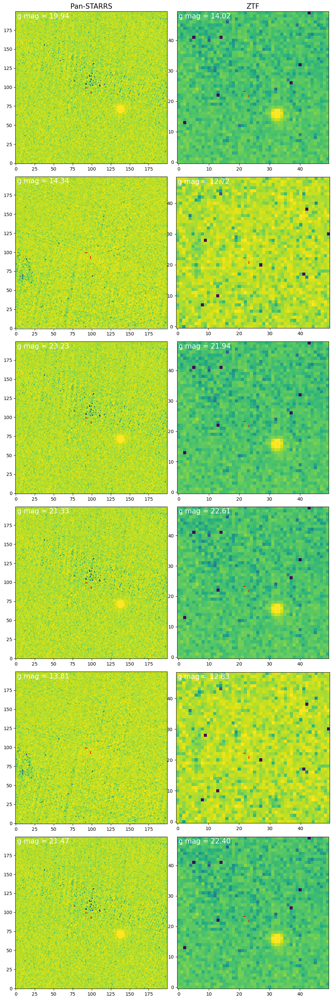

In [45]:
fig, axes = plt.subplots(n_examples, 2, figsize=(10, 30))
for i_ex, (ax_row, tab_row) in enumerate(zip(axes, changing_tables['g'])):

    # Plot
    # pstar_x, pstar_y = pstarr_sources[i_ex].ra_dec_to_pix(tab_row['PSTARR_ra'], tab_row['PSTARR_dec'], band='g')
    # ztf_x, ztf_y = pstarr_sources[i_ex].ra_dec_to_pix(tab_row['ZTF_ra'], tab_row['ZTF_dec'], band='g')
    pstar_ra, pstar_dec = tab_row['PSTARR_ra'], tab_row['PSTARR_dec']
    ztf_ra, ztf_dec = tab_row['ZTF_ra'], tab_row['ZTF_dec']
    pstarr_sources[i_ex].plot_cutout(band='g', ax=ax_row[0])

    pstar_x, pstar_y = ztf_sources[i_ex].ra_dec_to_pix(tab_row['PSTARR_ra'], tab_row['PSTARR_dec'], band='g')
    ztf_x, ztf_y = ztf_sources[i_ex].ra_dec_to_pix(tab_row['ZTF_ra'], tab_row['ZTF_dec'], band='g')
    ztf_sources[i_ex].plot_cutout(band='g', ax=ax_row[1])

    # Annotate with the delta mag
    ax_row[0].text(0.01, 0.99, rf'g mag = {tab_row["PSTARR_gPSFMag"]:.2f}', transform=ax_row[0].transAxes, ha='left', va='top', fontsize=15, color='white')
    ax_row[1].text(0.01, 0.99, rf'g mag = {tab_row["ZTF_gPSFMag"]:.2f}', transform=ax_row[1].transAxes, ha='left', va='top', fontsize=15, color='white')
    # ax_row[0].text(0.01, 0.99, rf'$\Delta$mag = {dmags[i_ex]:.2f}', transform=ax_row[0].transAxes, ha='left', va='top', fontsize=15, color='white')

axes[0][0].set_title('Pan-STARRS', fontsize=15)
axes[0][1].set_title('ZTF', fontsize=15)

plt.tight_layout()
plt.show()

In [46]:
changing_tables['g'][[c for c in changing_tables['g'].colnames if 'flag' in c.lower()] + ['ra', 'dec', 'ZTF_gPSFMag', 'ZTF_gPSFMagErr', 'PSTARR_gPSFMag', 'PSTARR_gPSFMagErr']]

ZTF_sepExtractionFlag,ZTF_gKronCircleFlag,ZTF_gKronFlag,ZTF_gPSFFlags,Catalog_Flag,ZTF_g_upper_lim_flag,ra,dec,ZTF_gPSFMag,ZTF_gPSFMagErr,PSTARR_gPSFMag,PSTARR_gPSFMagErr
float64,float64,float64,float64,int64,bool,float64,float64,float64,float64,float64,float64
1.0,1.0,0.0,0.0,0,False,4.196905453860781,9.290276317134948,14.016738011920951,3.415424440235699e-05,19.9354000091553,0.0789579972624779
1.0,0.0,0.0,0.0,0,False,5.083195363821143,9.290408451624687,12.718902148971214,1.2452357443562686e-05,14.3430004119873,0.000595999998040497
0.0,1.0,0.0,0.0,0,False,4.196905453860781,9.290276317134948,21.93866134872924,0.05239454398176241,23.2255992889404,0.161412999033928
1.0,0.0,32.0,0.0,0,False,4.196905453860781,9.290276317134948,22.605567685233154,0.08984446701491663,21.3328990936279,0.0321389995515347
1.0,0.0,0.0,0.0,0,False,5.083195363821143,9.290408451624687,12.826902568495692,1.353953828577276e-05,13.8062000274658,0.0500000007450581
0.0,0.0,32.0,0.0,0,False,4.196905453860781,9.290276317134948,22.40173844436222,0.08635691293628191,21.466100692749,0.0361180007457733
0.0,0.0,0.0,0.0,0,False,4.196905453860781,9.290276317134948,21.367006745061715,0.03101982761162754,20.6291999816895,0.0184320006519556
0.0,1.0,128.0,0.0,0,False,5.083195363821143,9.290408451624687,23.148243917613183,0.1861565963402213,22.4333000183105,0.104993000626564
0.0,1.0,0.0,0.0,0,False,4.196905453860781,9.290276317134948,20.57259462197183,0.013877537289247016,21.2401008605957,0.0299999993294477


## In Pan-STARRS but not ZTF

In [47]:
just_in_pstarr = {band: filtered_tables[band][filtered_tables[band]['Catalog_Flag'] == 2] for band in BANDS}
for band in BANDS:
    just_in_pstarr[band] = just_in_pstarr[band][~np.isnan(just_in_pstarr[band][f'PSTARR_{band}PSFMag'])]

just_in_pstarr['g']['ra'] = just_in_pstarr['g']['PSTARR_ra']
just_in_pstarr['g']['dec'] = just_in_pstarr['g']['PSTARR_dec']

n_examples = 6
only_ps_pstarr_sources = []
only_ps_ztf_sources = []
# for tab_row in just_in_pstarr['g'][:n_examples]:
i = 0
while len(only_ps_pstarr_sources) < n_examples:

    # Get the source
    tab_row = just_in_pstarr['g'][200 + i]
    pstarr_ps = Sources.PSTARR_Postage_Stamp(tab_row['ra'], tab_row['dec'], bands=['g'])
    ztf_ps = Sources.ZTF_Postage_Stamp(tab_row['ra'], tab_row['dec'], bands=['g'])

    if not np.all(np.isnan(pstarr_ps.images['g'])) and not np.all(np.isnan(ztf_ps.images['g'])):
        only_ps_pstarr_sources.append(pstarr_ps)
        only_ps_ztf_sources.append(ztf_ps)

    i += 1

this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]
this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]
this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]
this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]


Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=ra>4.65301155+AND+ra<5.54190045+AND+dec>8.48949394+AND+dec<9.37838284+AND+filtercode='zg'
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmphufu83u6/ztf_000499_zg_c01_q1_refimg.fits


the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]


this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]
this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]
this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]
this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]


Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=ra>4.939477940000001+AND+ra<5.82836684+AND+dec>8.49197182+AND+dec<9.380860720000001+AND+filtercode='zg'
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpohtdusxv/ztf_000499_zg_c01_q1_refimg.fits


the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]


this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]
this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]
this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]
this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]


Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=ra>4.958529410000001+AND+ra<5.84741831+AND+dec>8.4948313+AND+dec<9.3837202+AND+filtercode='zg'
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmp7c1c8kg7/ztf_000499_zg_c01_q1_refimg.fits


the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]


this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]
this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]
this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]
this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]


Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=ra>4.96299635+AND+ra<5.85188525+AND+dec>8.489449819999999+AND+dec<9.37833872+AND+filtercode='zg'
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmprqatzmwy/ztf_000499_zg_c01_q1_refimg.fits


the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]


this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]
this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]
this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]
this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]


Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=ra>4.28328413+AND+ra<5.17217303+AND+dec>8.5044264+AND+dec<9.393315300000001+AND+filtercode='zg'
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmp9ph67gka/ztf_000499_zg_c01_q1_refimg.fits


the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]


this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]
this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]
this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]
this form of the PCi_ja keyword is deprecated, use PCi_ja. [astropy.wcs.wcs]


Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=ra>4.9851466900000005+AND+ra<5.87403559+AND+dec>8.452510539999999+AND+dec<9.34139944+AND+filtercode='zg'
Image downloaded and saved at /var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/tmpa49njkan/ztf_000499_zg_c01_q1_refimg.fits


the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]


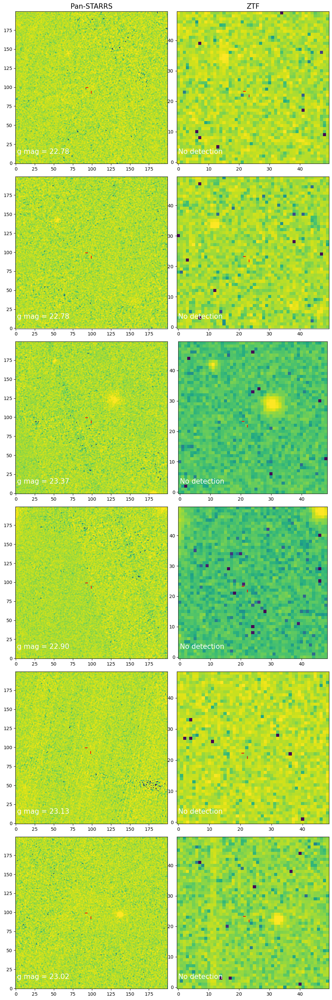

In [48]:
fig, axes = plt.subplots(n_examples, 2, figsize=(10, 30))
for i_ex, (ax_row, tab_row) in enumerate(zip(axes, just_in_pstarr['g'])):

    # Plot
    only_ps_pstarr_sources[i_ex].plot_cutout(band='g', ax=ax_row[0])
    only_ps_ztf_sources[i_ex].plot_cutout(band='g', ax=ax_row[1])

    # Annotate with the delta mag
    ax_row[0].text(0.01, 0.1, rf'g mag = {tab_row["PSTARR_gPSFMag"]:.2f}', transform=ax_row[0].transAxes, ha='left', va='top', fontsize=15, color='white')
    ax_row[1].text(0.01, 0.1, rf'No detection', transform=ax_row[1].transAxes, ha='left', va='top', fontsize=15, color='white')

axes[0][0].set_title('Pan-STARRS', fontsize=15)
axes[0][1].set_title('ZTF', fontsize=15)

plt.tight_layout()
plt.show()

In [20]:
changing_tables['g'][[c for c in changing_tables['g'].colnames if 'flag' in c.lower()]]

ZTF_sepExtractionFlag,ZTF_gKronCircleFlag,ZTF_gKronFlag,ZTF_gPSFFlags,Catalog_Flag,ZTF_g_upper_lim_flag
float64,float64,float64,float64,int64,bool
1.0,1.0,0.0,0.0,0,False
1.0,0.0,0.0,0.0,0,False
0.0,1.0,0.0,0.0,0,False
1.0,0.0,32.0,0.0,0,False
1.0,0.0,0.0,0.0,0,False
0.0,0.0,32.0,0.0,0,False
0.0,0.0,0.0,0.0,0,False
0.0,1.0,128.0,0.0,0,False
0.0,1.0,0.0,0.0,0,False


In [340]:
changing_tile = Tile(ra=np.mean(changing_tables['g']['ra']), dec=np.mean(changing_tables['g']['dec']), bands=['g'], data_dir='/Users/adamboesky/Research/long_transients/Data/ztf_data')

Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=ra>96.12368681751151+AND+ra<97.01257571751152+AND+dec>12.416139461279613+AND+dec<13.305028361279614+AND+filtercode='zg'
Image already downloaded and saved at /Users/adamboesky/Research/long_transients/Data/ztf_data/ztf_000513_zg_c12_q2_refimg.fits


the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]


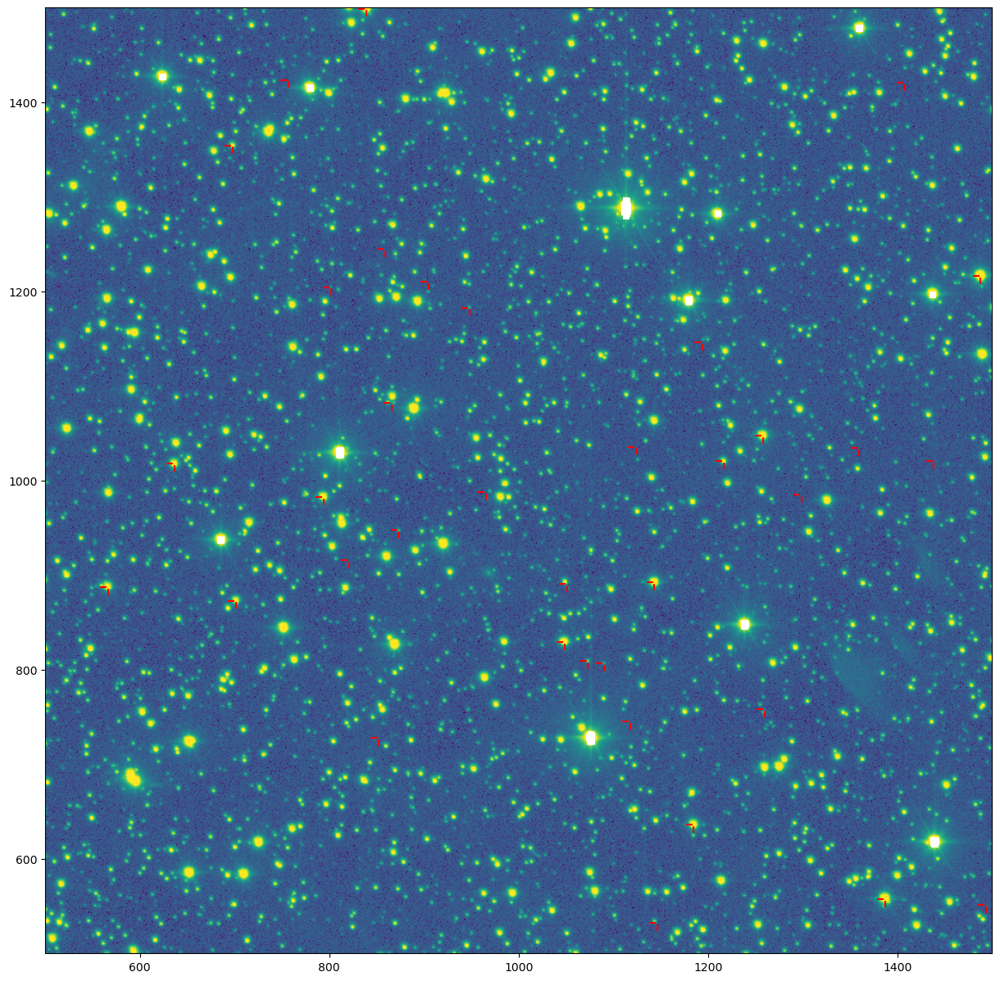

In [350]:
changing_tile.ztf_catalogs['g'].sextractors['g'].plot_segmap(
    show_sources=False,
    image_is_subtracted=True,
)

plt.scatter(changing_tables['g']['ZTF_x'] - 5, changing_tables['g']['ZTF_y'], color='red', marker='_')
plt.scatter(changing_tables['g']['ZTF_x'], changing_tables['g']['ZTF_y'] - 5, color='red', marker='|')

bounds = (500, 1500)
plt.xlim(bounds)
plt.ylim(bounds)
plt.show()

In [11]:
import importlib
from Source_Analysis import Sources
importlib.reload(Sources)
from Source_Analysis import Sources

In [12]:
src = Sources.Source(changing_tables['g']['ra'][0], changing_tables['g']['dec'][0])
src.data

Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=ra>96.93679399932152+AND+ra<97.82568289932154+AND+dec>13.062581214004657+AND+dec<13.951470114004659+AND+filtercode='zg'
Loading catalogs!
Loading g...
Loading r...
Loading i...
Searching for source in the catalogs!
Loading catalogs!
Searching g...
min sep = 0.0 deg
Searching r...
min sep = 2.585036269951882e-06 deg
Searching i...
min sep = 1.6490104903369153e-05 deg


/Users/adamboesky/Research/long_transients/Source_Analysis/Source.py:162: StringTruncateWarning: truncated right side string(s) longer than 3 character(s) during assignment
  if isinstance(cat[cname][ind_closest], bool):


ZTF_iKronMag,Catalog_Flag,ZTF_ycpeak,ZTF_errxy,PSTARR_gApMag,ZTF_r_mag_limit,ZTF_b,PSTARR_rPSFMag,ZTF_y2,PSTARR_gPSFMag,ZTF_xpeak,ZTF_rPSFMagErr,PSTARR_iKronMag,ra,ZTF_cflux,ZTF_ymax,PSTARR_iApMag,ZTF_rKronFlag,ZTF_y,ZTF_rKronMagErr,ZTF_ypeak,PSTARR_PanSTARR_ID,ZTF_i_zero_pt_mag,association_separation_arcsec,ZTF_iPSFMag,PSTARR_gpsfLikelihood,ZTF_r_zero_pt_mag,ZTF_gPSFFlags,PSTARR_rKronMag,ZTF_flux,PSTARR_primaryDetection,ZTF_tnpix,ZTF_rPSFMag,ZTF_rKronMag,ZTF_g_zero_pt_mag,PSTARR_rKronMagErr,PSTARR_ipsfLikelihood,ZTF_gKronMag,PSTARR_gKronMagErr,ZTF_xmax,ZTF_cyy,ZTF_xmin,ZTF_x2,PSTARR_iApMagErr,ZTF_dec,ZTF_iKronCircleFlag,PSTARR_iPSFMag,ZTF_ymin,ZTF_gKronMagErr,ZTF_errx2,ZTF_a,ZTF_gKronFlag,ZTF_qfit,ZTF_rPSFFlags,ZTF_x,ZTF_xcpeak,ZTF_ra,PSTARR_gKronMag,x,ZTF_KronRad,ZTF_iKronMagErr,ZTF_thresh,PSTARR_dec,ZTF_peak,ZTF_sepExtractionFlag,ZTF_cxx,PSTARR_rApMag,PSTARR_ra,ZTF_gPSFMagErr,ZTF_cxy,ZTF_npix,ZTF_i_mag_limit,y,PSTARR_rpsfLikelihood,PSTARR_iPSFMagErr,PSTARR_iKronMagErr,PSTARR_rPSFMagErr,ZTF_erry2,PSTARR_gApMagErr,ZTF_g_mag_limit,ZTF_iPSFFlags,dec,PSTARR_rApMagErr,ZTF_theta,ZTF_xy,ZTF_gPSFMag,ZTF_iPSFMagErr,ZTF_gKronCircleFlag,ZTF_cpeak,ZTF_rKronCircleFlag,ZTF_cfit,ZTF_iKronFlag,Catalog,PSTARR_gPSFMagErr
float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,float64,str3,float64
12.791642536028816,0.0,271.0,-1.4110092852262729e-09,14.5733995437622,22.7199001,1.6358566284179688,16.92919921875,2.885609549136973,14.3922996520996,2112.0,1.925127209860376e-05,13.3621997833252,97.38123844932153,188009.296875,288.0,13.3248996734619,0.0,271.2406019274005,0.00010222007439372047,271.0,1.24200973812609e+17,25.66,0.2946473852428075,12.917681323184866,-999.0,26.275,0.0,-999.0,188026.328125,1.0,514.0,12.855757031180712,12.84141036678411,26.325,-999.0,0.0,13.204322829254243,-999.0,2122.0,0.34755125641822815,2089.0,2.7868727264888093,0.000197999994270504,13.506988735582214,0.0,13.5675001144409,260.0,0.00011466569107848095,8.079798461390617e-07,1.7310272455215454,0.0,0.06741073257844116,0.0,2111.9664974556836,2112.0,97.38122031237604,-999.0,2111.9664974556836,0.962962613984827,0.00022254005446379412,0.9307897686958313,13.5070625924271,28614.330078125,1.0,0.3598647117614746,-999.0,97.381256586267,2.315242527826016e-05,0.03801626339554787,548.0,21.7243996,271.2406019274005,-999.0,0.000713000015821308,0.000914999982342124,0.0079560000449419,6.494673851723426e-07,0.000319000013405457,22.8647995,0.0,13.507025664004658,0.00127999996766448,-0.9420166611671448,-0.1524185158061755,13.239677411941727,5.006288133533402e-05,0.0,17259.681640625,1.0,-0.009058619434547955,0.0,Bot,0.00084300001617521


In [17]:
for band in ['g', 'r', 'i']:
    print(band)
    print(f'Source mags = {float(src.data[f'ZTF_{band}PSFMag']), float(src.data[f'PSTARR_{band}PSFMag'])}')
    print(f'Table mags = {float(changing_tables[band][0][f'ZTF_{band}PSFMag']), float(changing_tables[band][0][f'PSTARR_{band}PSFMag'])}')
    print(f'Source delta mag = {float(src.data[f'ZTF_{band}PSFMag'] - src.data[f'PSTARR_{band}PSFMag'])}')
    print(f'Table delta mag = {float(changing_tables[band][0][f'ZTF_{band}PSFMag'] - changing_tables[band][0][f'PSTARR_{band}PSFMag'])}\n')

g
Source mags = (13.239677411941727, 14.3922996520996)
Table mags = (13.239677411941727, 14.3922996520996)
Source delta mag = -1.1526222401578732
Table delta mag = -1.1526222401578732

r
Source mags = (12.855757031180712, 16.92919921875)
Table mags = (15.649444807618707, 19.8773002624512)
Source delta mag = -4.073442187569288
Table delta mag = -4.227855454832493

i
Source mags = (12.917681323184866, 13.5675001144409)
Table mags = (18.00015566401199, 18.6179008483887)
Source delta mag = -0.6498187912560347
Table delta mag = -0.6177451843767088



/var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/ipykernel_1185/2723813325.py:3: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print(f'Source mags = {float(src.data[f'ZTF_{band}PSFMag']), float(src.data[f'PSTARR_{band}PSFMag'])}')
/var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/ipykernel_1185/2723813325.py:5: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  print(f'Source delta mag = {float(src.data[f'ZTF_{band}PSFMag'] - src.data[f'PSTARR_{band}PSFMag'])}')


# Match Changing Sources Between Bands

In [29]:
from astropy.coordinates import SkyCoord
SkyCoord(97.32338747677, 13.552311184820883, unit='deg').to_string('hmsdms')

'06h29m17.61299442s +13d33m08.32026536s'

In [12]:
test = ascii.read('/Users/adamboesky/Research/long_transients/Data/catalog_results/field_results/000513_g.ecsv').copy()
test['dmag'] = np.abs(test['ZTF_gKronMag'] - test['ZTF_gPSFMag'])
test[['ra', 'dec', 'dmag']]

ra,dec,dmag
float64,float64,float64
97.08175280337181,13.558841024788052,nan
97.0487448669643,13.558118691302987,nan
97.39974898203306,13.562550638574045,nan
97.5335982212585,13.564133481484006,nan
97.6024104038957,13.565077439278404,nan
96.82416357927866,13.554107540493181,nan
97.09757402861538,13.558415568921832,nan
97.61685622727617,13.564489659064673,nan
97.2150653490892,13.559343250308224,nan


In [47]:
test_snr_mask = get_snr_from_mag(test['ZTF_gKronMag'], test['ZTF_gKronMagErr'], zp=25) > 3
src = test[np.logical_and(test['ZTF_sepExtractionFlag'] == 1, test_snr_mask)][100]
src[['ra', 'dec', 'dmag']]

/var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/ipykernel_20026/2294796586.py:5: RuntimeWarning: overflow encountered in power
  flux = 10 ** ((mag - zero_point) / -2.5)
/var/folders/2f/vnb6fr7n7g32fwlgp_k3l3sc0000gn/T/ipykernel_20026/2294796586.py:13: RuntimeWarning: invalid value encountered in divide
  return flux / fluxerr


ra,dec,dmag
float64,float64,float64
97.33846748533014,13.552421270332482,0.7648410290872363


In [45]:
from Extracting.Tile import Tile
src_tile = Tile(ra=src['ra'], dec=src['dec'], bands=['g'], data_dir='/Users/adamboesky/Research/long_transients/Data/ztf_data')

Querying metadata from https://irsa.ipac.caltech.edu/ibe/search/ztf/products/deep?WHERE=ra>96.89402303533014+AND+ra<97.78291193533015+AND+dec>13.107976820332482+AND+dec<13.996865720332483+AND+filtercode='zg'
Image already downloaded and saved at /Users/adamboesky/Research/long_transients/Data/ztf_data/ztf_000513_zg_c12_q1_refimg.fits


the RADECSYS keyword is deprecated, use RADESYSa. [astropy.wcs.wcs]


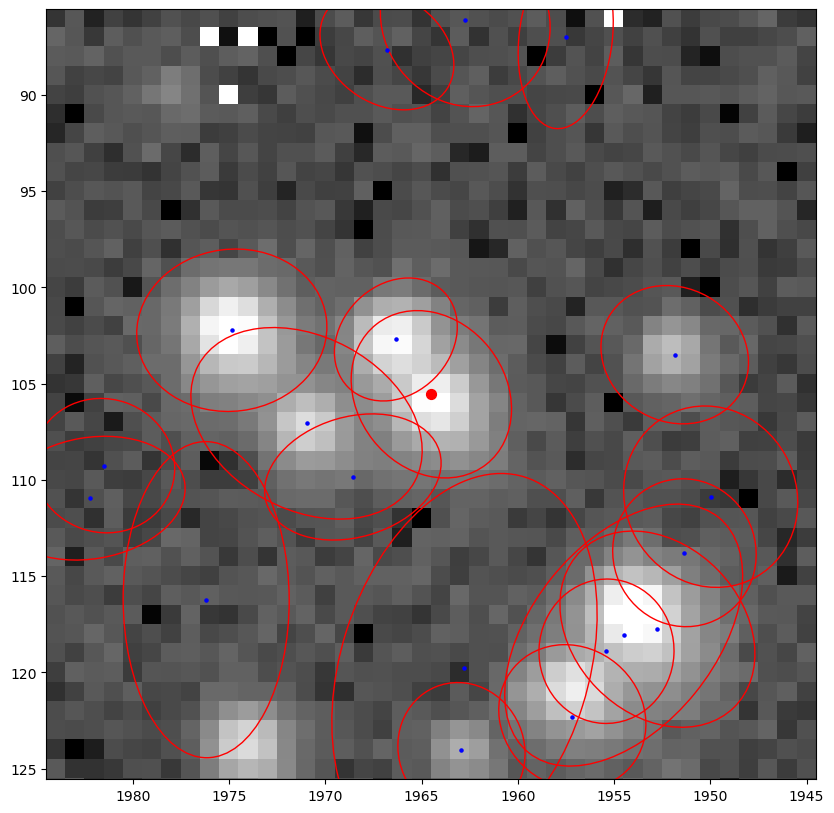

In [48]:
from matplotlib.patches import Ellipse
from astropy.visualization import simple_norm

im_rad = 20
small_test = test[np.logical_and(np.sqrt((test['ZTF_x'] - src['ZTF_x'])**2 + (test['ZTF_y'] - src['ZTF_y'])**2) < im_rad, test_snr_mask)]
image_data = src_tile.ztf_catalogs['g'].sextractors['g'].image_sub.copy()
# image_data = image_data[int(src['ZTF_x']-im_rad):int(src['ZTF_x']+im_rad), int(src['ZTF_y']-im_rad):int(src['ZTF_y']+im_rad)]
# image_data = src_tile.ztf_catalogs['g'].sextractors['g'].get_sources(get_segmap=True)[1]
# image_data = image_data[int(src['ZTF_x']-im_rad):int(src['ZTF_x']+im_rad), int(src['ZTF_y']-im_rad):int(src['ZTF_y']+im_rad)]
# image_data = (image_data != 0).astype(float)
norm = simple_norm(image_data, 'log', percent=99)

fix, ax = plt.subplots(1, 1, figsize=(10, 10))
ax.imshow(image_data, cmap='gray', origin='lower', norm=norm)
# ax.imshow(image_data, cmap='gray')
for j in range(len(small_test)):
    e = Ellipse(xy=(small_test['ZTF_x'][j], small_test['ZTF_y'][j]),
                width=6*small_test['ZTF_a'][j],
                height=6*small_test['ZTF_b'][j],
                angle=small_test['ZTF_theta'][j] * 180. / np.pi)
    e.set_facecolor('none')
    e.set_edgecolor('red')
    ax.add_artist(e)
ax.scatter(small_test['ZTF_x'], small_test['ZTF_y'], s=5, color='blue')
ax.scatter(src['ZTF_x'], src['ZTF_y'], s=50, color='red')
plt.xlim((src['ZTF_x'] - im_rad, src['ZTF_x'] + im_rad))
plt.ylim((src['ZTF_y'] - im_rad, src['ZTF_y'] + im_rad))
plt.gca().invert_yaxis()
plt.gca().invert_xaxis()
plt.show()